In [1]:
Quick_Run = True
testing_results_dir = '/content/drive/MyDrive/SC_Project/Testing_Results/'
permanent_results_dir = '/content/drive/MyDrive/SC_Project/Permanent_Results/'

# MAIN_LOAD_OUTPUT: Superior Colliculus Neuronal Subtype Analysis Project File
# (READ BEFORE RUNNING)


- This file contains the runnable data output of all the functions and algorithms used to obtain the results for the Superior Colliculus Neuronal Subtype Analysis Project

- This file can be ran in two seperate ways,

- A ***Quick run*** which outputs the data through the use of all pre-existing data presets obtained

- Or a ***Full Run*** through running the raw functions themselves

- If this file is being run for testing purposes one should do a ***Quick run*** to simply test the data output to make sure the drive, imports, and other externals are in working order, before doing a ***Full Run***

# Quick Run

- To perform a ***Quick run*** simply set the *Quick_Run* parameter above to True, this will access all the dictionary files from the Permanent_Results folder and only run the functions neccesarry in outputing the data.

# Full Run

- To perform a ***Full run*** set the *Quick_Run* paramter above to false. This will not access any of the pre-existing already saved data and will run the entire file by scratch

- **NOTE** ***The full run of this program will produce slightly variant results for the Correlated Unique Genes dataset***, as these genes were further curated by hand to remove all poor quality genes that was not able to be siphoned by the algorithm. This is the only dataset curated further by hand all other datasets should be exactly the same

- **NOTE** ***The ***Full run*** of this program from start to finish will take upwards of ONE HOUR in runtime***, with the Correlated Unique Genes, Unique/SD ranked genes, and the Distinction Functions being the slowest due to the large dataset size needed to be parsed through and thus are preset in ***Quick run***


# File Overview

This File performs the function of the following tasks:

- Timepoint UMAP
- Neuronal Identification through Dotplots
- Neuronal UMAP
- Timepoint Cluster Dendrogram
- Neuronal Rank Differentially Expressed Genes
- Labeling anndata cells (Inihb, Excit, Mix, Cluster_Labels, and True, Relative, and Distinct cluster labeling)
- Unique/ Standard Deviation Ranked Gene Curation
- Correlated Unique Genes Curation
- True/Relative/and Non Distinct Cluster and Gene Identification
- True/Relative/and Non Distinct Cluster UMAPs
- Harmony Integrations
- Harmony UMAPs
- Harmony Correlations
- Sankey Plots (Harmony Sankey, Correlated Unique Genes Sankey, and Harmony vs Correlated Unique Genes Sankey)
-  Superior Colliculus Layer to Cluster Correlation Analysis and Hypothesis Testing
- Schizophrenia/Autism Gene Dotplots


These functions and their corresponding outputs are performed (other than existing python packages) through the use of these function files:

- Correlated_Unique
- Correlated_Unique_Sankey
- Distinction
- Gene_Filtering
- General_Sankey
- Harmony_Correlation
- Harmony_Sankey
- Labeler
- Layer_Cluster_Relation


These files are not accessible through this Load_Output file but can be changed, accessed, and manipulated within the functions folder.

# Data-Presets and Permanent Results
- This file accesses some preset data (regardless of run type) this includes the pre-processed anndata, hand curated data (Allen Brain Layer Data), and other data that is not performed by this file.

#Functions Not Performed by this file

PRE-PROCESSING
- The preprocessing of the anndata including filtering, Scaling, Normalization, Log-Transform, High Variable Gene Selection, Doublet Filtering, dimension reduction of complete anndata, batch effect correction, and resolution adjustment, is not performed by this file but in the Pre-Processing File.

- The Pre-processing file contains the overview of what was done but is not included in this file to maintain the stability of the visual clustering output as each re-run of the pre-processing dataset can change the visual form the data(not the expressional data, just visual) and the ordering of clusters.

- As such, the pre-processed anndata object has been permanently saved and is accessed by this file.

ALLEN BRAIN / PANTHER/ CELL BROWSER API

- The API algorithm written to access the Allen brain image results, panther ontology results and the Cell browser images with respect to the timepoints and their respective genes is listen in the API folder and is not ran by this file, however, the data obtained from the allen brain api is used for some of the functions performed by this file

# Data Output

- If ran for testing, whether ***Quick_Run*** or ***Full Run***, the data will be outputed in the testing folder. Each consecutive run of the program will override any previous data within the folder. All permanent results are listed in the permanent results folder

# ***HOW TO RUN***

- First change the ***Quick_run*** option to ***True*** if you would like to do a Quick_run or ***False*** if you want to do a ***Full Run***
- Make any overarching directory changes if needed, otherwise use default directories and make sure the corresponding folders are present within said directories
- To run simply go to runtime and click Run All (if in collab)
- After your intiial run you may recieve an error, this is due to the import installations as to maintain the integrity of the data and the packages used, the versions of all the python packages have been set to the date through which this program was written
- To overcome this error simply restart and run again, this will load all python installations
- After this you will recieve a prompt asking to sign into your drive (if in collab)
- Sign in and the program should run

-It is advised to use google collab for running this file as this file as not been tested on Juptyr notebook or any other ipynb IDE




In [2]:
!python --version

Python 3.10.12


In [3]:
!pip install 'scanpy == 1.9.1'
!pip install h5py
!pip install scvi-tools
!pip install scikit-learn
!pip install pynndescent
!pip install scrublet
!pip install bbknn
!pip install leidenalg
!pip install 'matplotlib == 3.6'
!pip install kaleido
!pip install plotly==5.3.1
!pip install harmonypy
!pip install import_ipynb

from scipy import stats
import math
import re
import json
import ast
import statistics
import scanpy.external as sce
import scrublet as scr
import scvi
import plotly
import kaleido
import plotly.graph_objects as go
import urllib, json
import h5py
import numpy as np
import pandas as pd
import anndata
import matplotlib
import matplotlib.pyplot as plt
import scanpy as sc
import os
from google.colab import drive
import import_ipynb
import shutil

/usr/local/lib/python3.10/dist-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/usr/local/lib/python3.10/dist-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [4]:
drive.mount('/content/drive')
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
drive  sample_data


In [5]:
sc.settings.verbosity = 0            # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.9.2 umap==0.5.3 numpy==1.22.4 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.6 pynndescent==0.5.10


In [6]:
# Read-In Files:
h5ad_file_dir = permanent_results_dir + 'All_h5ad/'
p0_doubletfiltered = sc.read_h5ad(h5ad_file_dir + 'Timepoint_h5ad/p0Results.h5ad')
p4_6_doubletfiltered = sc.read_h5ad(h5ad_file_dir+'Timepoint_h5ad/p4_6Results.h5ad')
p10_doubletfiltered = sc.read_h5ad(h5ad_file_dir+'Timepoint_h5ad/p10Results.h5ad')
p15_doubletfiltered = sc.read_h5ad(h5ad_file_dir+'Timepoint_h5ad/p15Results.h5ad')

p0_doubletfiltered_neuronal_file = h5ad_file_dir + 'Neuronal_h5ad/p0_Neuronal_Results.h5ad'
p4_6_doubletfiltered_neuronal_file = h5ad_file_dir + 'Neuronal_h5ad/p4_6_Neuronal_Results.h5ad'
p10_doubletfiltered_neuronal_file = h5ad_file_dir + 'Neuronal_h5ad/p10_Neuronal_Results.h5ad'
p15_doubletfiltered_neuronal_file = h5ad_file_dir + 'Neuronal_h5ad/p15_Neuronal_Results.h5ad'

p0_doubletfiltered_neuronal = sc.read_h5ad(p0_doubletfiltered_neuronal_file)
p4_6_doubletfiltered_neuronal = sc.read_h5ad(p4_6_doubletfiltered_neuronal_file)
p10_doubletfiltered_neuronal = sc.read_h5ad(p10_doubletfiltered_neuronal_file)
p15_doubletfiltered_neuronal = sc.read_h5ad(p15_doubletfiltered_neuronal_file)

/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
#### LOADS FUNCTIONS FROM FUNCTIONS DIRECTORY, CHANGE IF FUNCTIONS DIRECTORY IS DIFFERENT####

%cd "/content/drive/MyDrive/SC_Project/All_Programs/Functions"

/content/drive/MyDrive/SC_Project/All_Programs/Functions


In [8]:
import Correlated_Unique
import Correlated_Unique_Sankey
import Distinction
import Gene_Filtering
import General_Sankey
import Harmony_Correlation
import Harmony_Sankey
import Labeler
import Layer_Cluster_Relation

importing Jupyter notebook from Correlated_Unique.ipynb
importing Jupyter notebook from Correlated_Unique_Sankey.ipynb
importing Jupyter notebook from Distinction.ipynb
importing Jupyter notebook from Gene_Filtering.ipynb
importing Jupyter notebook from General_Sankey.ipynb
importing Jupyter notebook from Harmony_Correlation.ipynb
importing Jupyter notebook from Harmony_Sankey.ipynb
importing Jupyter notebook from Labeler.ipynb
importing Jupyter notebook from Layer_Cluster_Relation.ipynb


In [9]:
sc.settings.verbosity = 2  # reduce the verbosity

# Dictionary Files

- Loads preset saved data for all_timepoint_unique_genes_dict, all_timepoint_standard_deviation_genes_dict, all_timepoint_correlated_unique_genes_dict, and all_timepoint_true_relative_distinct_unique_genes_dict

- Loads said dictionary files only if the ***Quick_run*** variable is set to true, allowing for faster runtime for testing output

In [10]:
files_list = ['all_timepoint_unique_genes_dict.txt', 'all_timepoint_standard_deviation_genes_dict.txt','all_timepoint_correlated_unique_genes_dict.txt' ,'all_timepoint_true_relative_distinct_unique_genes_dict.txt']
all_timepoint_unique_genes_dict = {}
all_timepoint_standard_deviation_genes_dict = {}
all_timepoint_correlated_unique_genes_dict = {}
all_timepoint_true_relative_distinct_unique_genes_dict = {}

In [11]:
if Quick_Run:
  for x, diction_file in enumerate(files_list):
    with open(permanent_results_dir + 'Dictionary_Files/'+diction_file, 'r') as rel_file:
      string_literal_dict = str(rel_file.readlines()[0].strip().replace(", inf)",", 1000000)"))
      parsed_literal = ast.parse(string_literal_dict, mode='eval')
      fixed_literal = ast.fix_missing_locations(parsed_literal)
      compiled_dict_eval = compile(fixed_literal, '<string>', 'eval')
      if x == 0:
        all_timepoint_unique_genes_dict = eval(compiled_dict_eval)
      if x == 1:
        all_timepoint_standard_deviation_genes_dict = eval(compiled_dict_eval)
      if x == 2:
        all_timepoint_correlated_unique_genes_dict = eval(compiled_dict_eval)
      if x == 3:
        all_timepoint_true_relative_distinct_unique_genes_dict = eval(compiled_dict_eval)

# Timepoint UMAP

- Outputs the clusters of all four timepoints including all cell types, i.e astrocytes, oligodendrocytes, glial cells, neural progenitors, neurons, etc.

- The UMAPs are outputted by leiden (clusters) and by condition (experimental dataset)

In [12]:
timepoint_umap_dir = testing_results_dir + 'Timepoint_Umaps'

if os.path.exists(timepoint_umap_dir):
  shutil.rmtree(timepoint_umap_dir)
os.mkdir(timepoint_umap_dir)

In [13]:
# CHANGE GLOBAL DIRECTORY FOR FIGURES: TIMEPOINT
sc.settings.figdir = testing_results_dir + 'Timepoint_Umaps/'

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


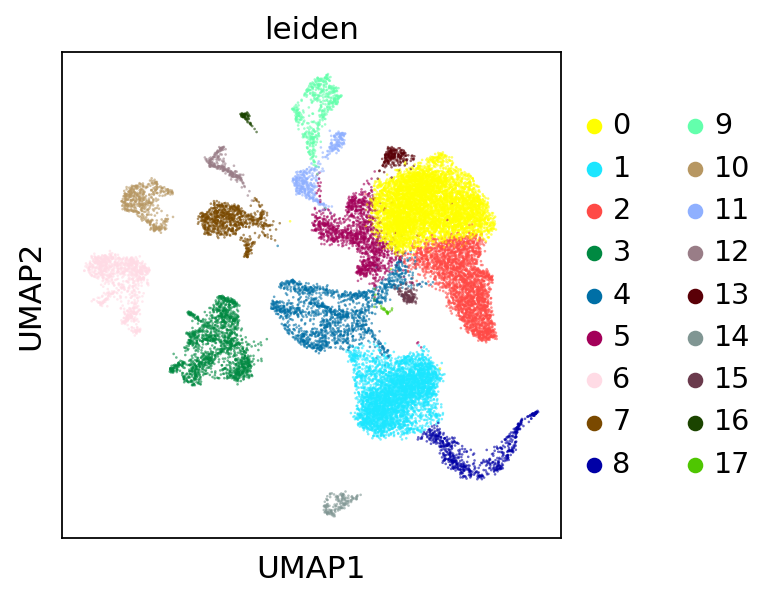

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


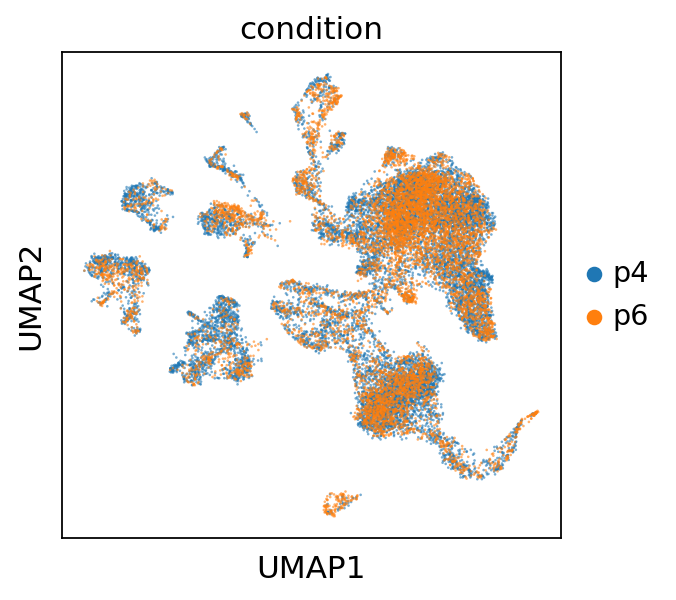

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


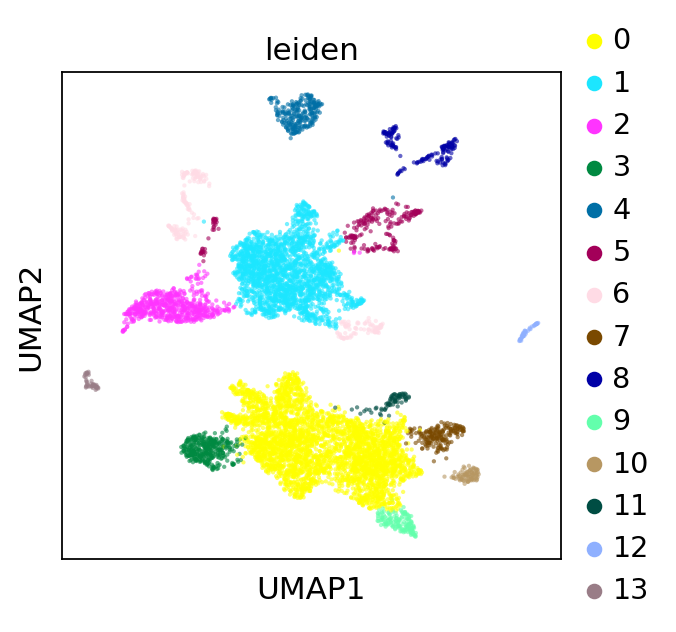

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


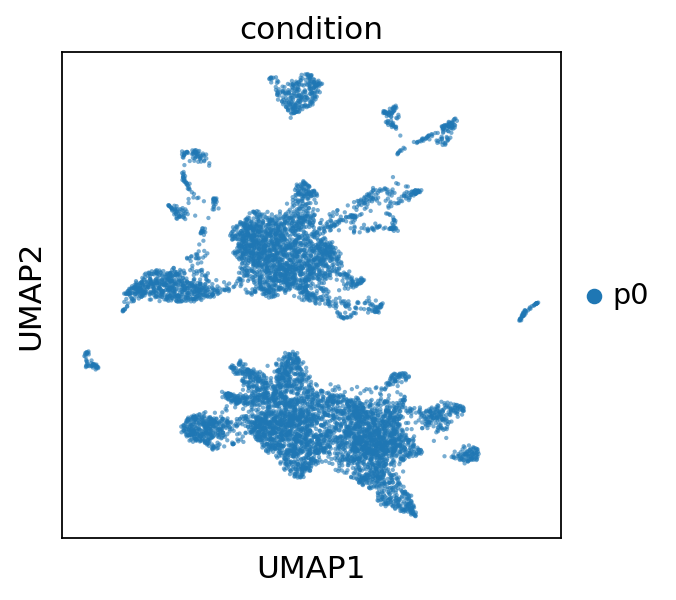

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


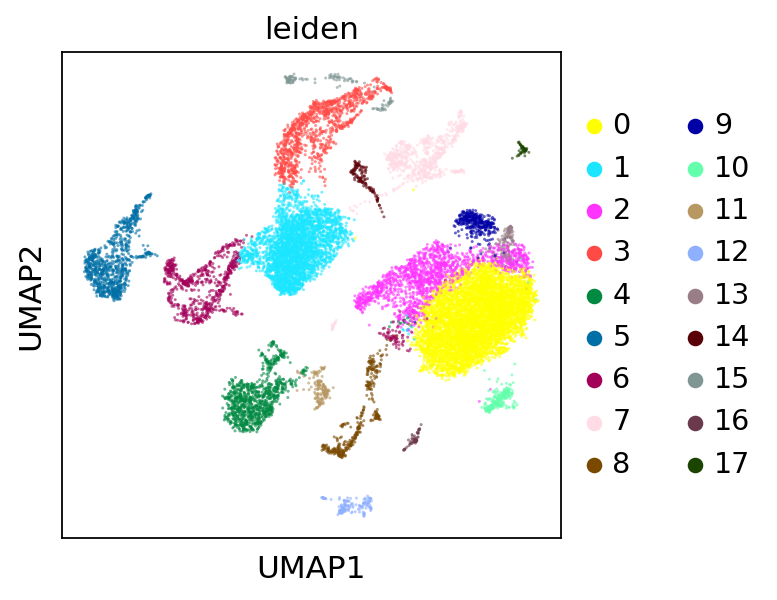

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


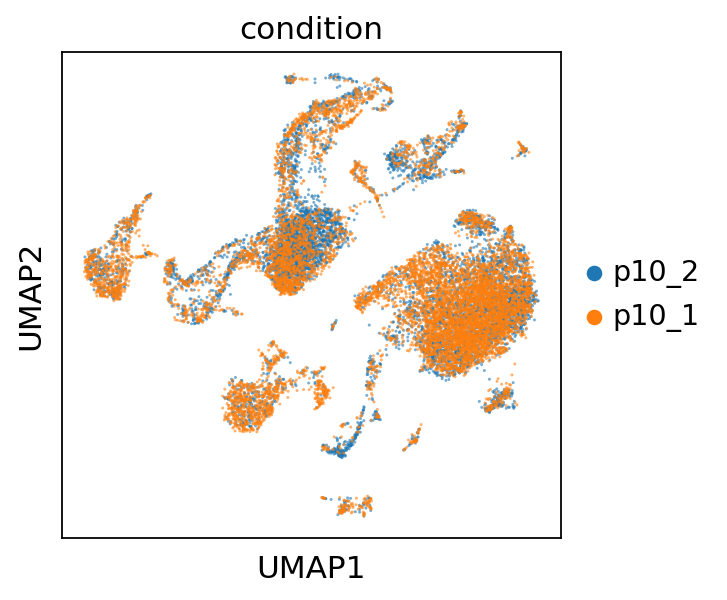

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


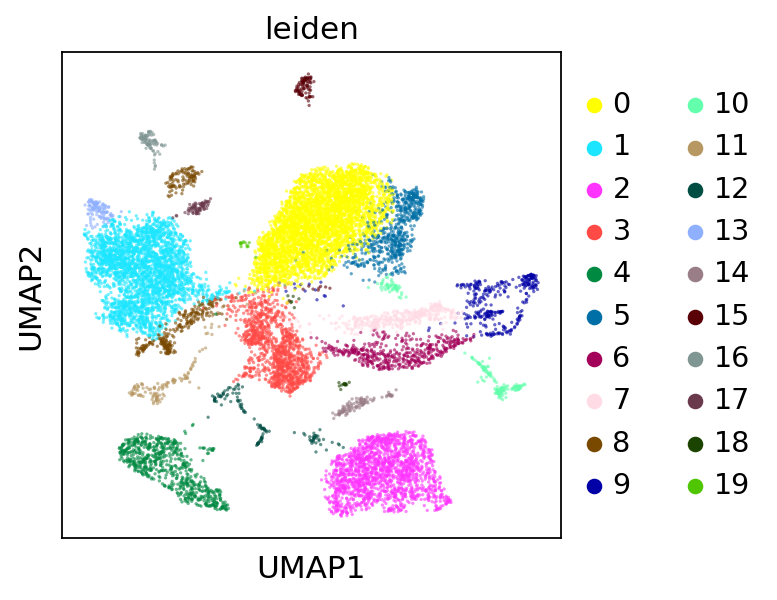

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


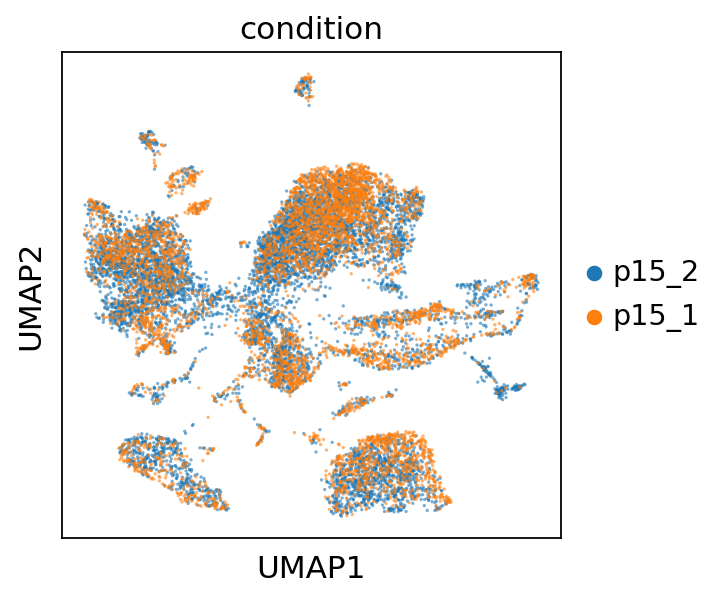

In [14]:
sc.pl.umap(p4_6_doubletfiltered, color= "leiden", alpha = .6, save='_p4_6_leiden.png')
sc.pl.umap(p4_6_doubletfiltered, color= "condition", alpha = .6, save='_p4_6_condition.png')

sc.pl.umap(p0_doubletfiltered, color= "leiden", alpha = .6, save='_p0_leiden.png')
sc.pl.umap(p0_doubletfiltered, color= "condition", alpha = .6, save='_p0_condition.png')

sc.pl.umap(p10_doubletfiltered, color= "leiden", alpha = .6, save='_p10_leiden.png')
sc.pl.umap(p10_doubletfiltered, color= "condition", alpha = .6, save='_p10_condition.png')

sc.pl.umap(p15_doubletfiltered, color= "leiden", alpha = .6, save='_p15_leiden.png')
sc.pl.umap(p15_doubletfiltered, color= "condition", alpha = .6, save='_p15_condition.png')

#Neuronal_Genes Identification and Dotplots

- The neuronal genes are siphoned through neuronal marker genes Syn1, Rbfox3,Gad1, Slc17a6, and Snap25

- The dotplots of these these are then plotted to identify the neuronal clusters which by default express these genes

In [15]:
Neuronal_Genes =  ["Syn1","Rbfox3","Gad1","Slc17a6", "Snap25"]

In [16]:
neuronal_dotplots_dir = testing_results_dir + 'Neuronal_Dotplots'
if os.path.exists(neuronal_dotplots_dir):
  shutil.rmtree(neuronal_dotplots_dir)
os.mkdir(neuronal_dotplots_dir)

In [17]:
sc.settings.figdir = testing_results_dir + 'Neuronal_Dotplots'

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


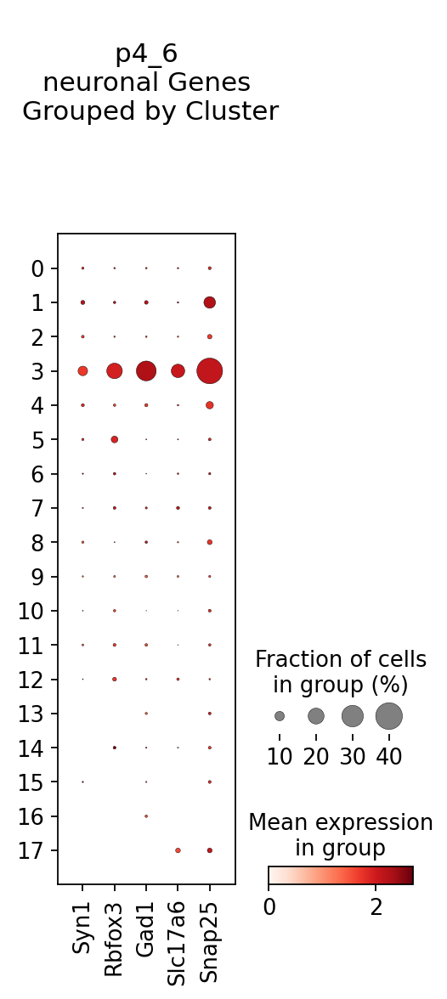

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


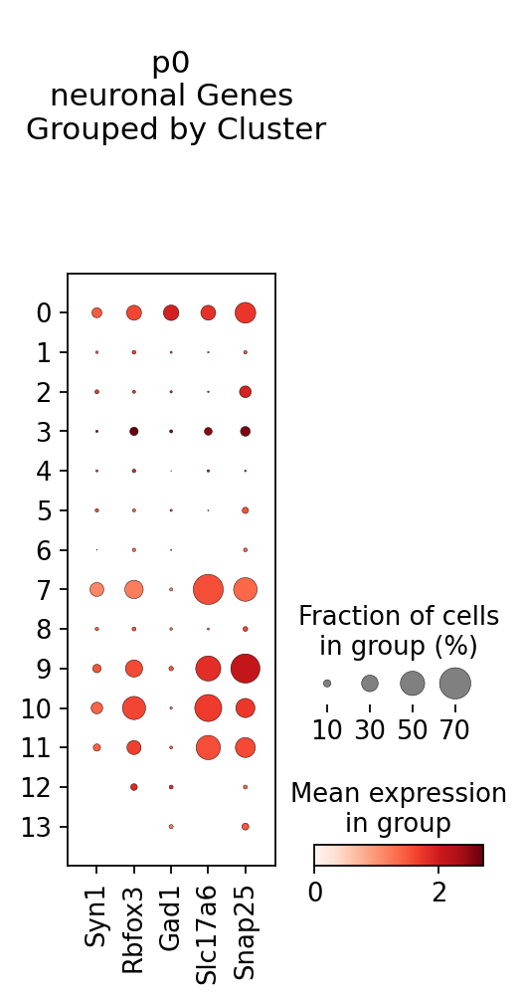

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


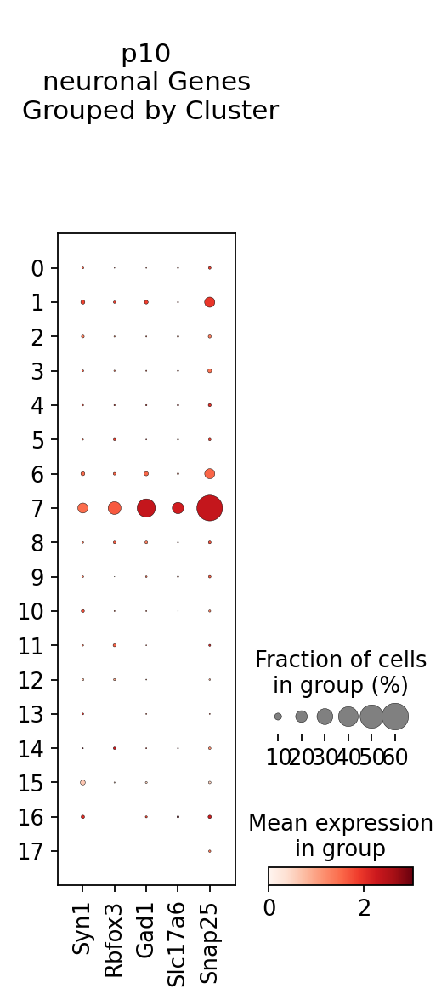

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


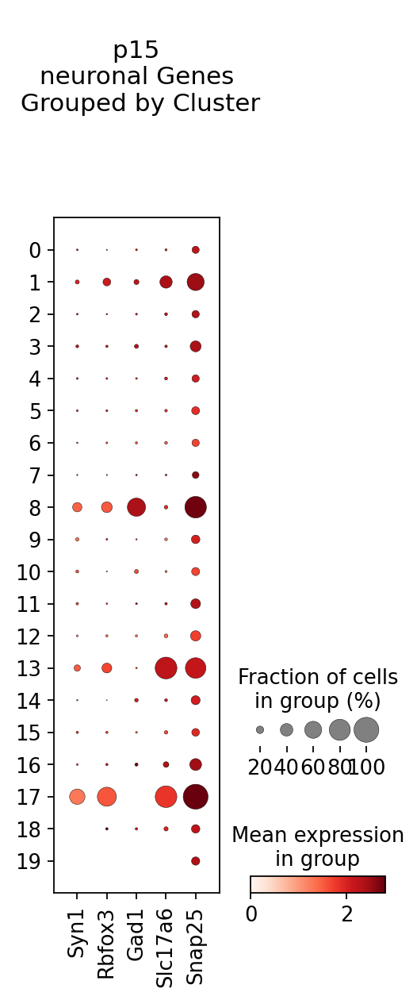

In [18]:
sc.pl.dotplot(p4_6_doubletfiltered, Neuronal_Genes, title='\n p4_6 \n neuronal Genes \n Grouped by Cluster',  mean_only_expressed=True, groupby='leiden', save='p4_6_neuronal_dotplot.png');

sc.pl.dotplot(p0_doubletfiltered, Neuronal_Genes, title='\n p0 \n neuronal Genes \n Grouped by Cluster',  mean_only_expressed=True, groupby='leiden', save='p0_neuronal_dotplot.png');

sc.pl.dotplot(p10_doubletfiltered, Neuronal_Genes, title='\n p10 \n neuronal Genes \n Grouped by Cluster',  mean_only_expressed=True, groupby='leiden', save='p10_neuronal_dotplot.png');

sc.pl.dotplot(p15_doubletfiltered, Neuronal_Genes, title='\n p15 \n neuronal Genes \n Grouped by Cluster',  mean_only_expressed=True, groupby='leiden', save='p15_neuronal_dotplot.png');

In [19]:
neuronal_umaps_dir = testing_results_dir + 'Neuronal_Umaps'
if os.path.exists(neuronal_umaps_dir):
  shutil.rmtree(neuronal_umaps_dir)
os.mkdir(neuronal_umaps_dir)

In [20]:
# CHANGE GLOBAL DIRECTORY FOR FIGURES: NEURONAL
sc.settings.figdir = testing_results_dir + 'Neuronal_Umaps/'

In [21]:
timepoints_anndata = [p0_doubletfiltered_neuronal, p4_6_doubletfiltered_neuronal, p10_doubletfiltered_neuronal, p15_doubletfiltered_neuronal]

timepoints_anndata_names = ['p0','p4/6','p10','p15']

# E_I_M Labels

- Assigns each of the cells within the leiden clusters to their respective Excitatory, Inhibitory, Mixed Label

- Allows for indexing and outputting data by Excitatory, Inhibitory, Mixed instead of leiden clusters

- Dictionary hand produced through leiden cluster relationships

- E1 is the cluster that shares all excitatory genes, and the last Ex value contains the least excitatory genes, the same applies for I1- Ix

In [22]:
E_I_M_labels_dict = {'p0': {'4': 'I3_p0_neuronal', '8': 'I1_p0_neuronal', '1': 'I4_p0_neuronal', '5': 'I2_p0_neuronal', '3': 'E4_p0_neuronal', '0': 'E2_p0_neuronal', '6': 'E1_p0_neuronal', '9': 'E3_p0_neuronal', '7': 'M2_p0_neuronal', '2': 'M1_p0_neuronal'}, 'p4/6': {'0': 'I2_p4/6_neuronal', '6': 'I1_p4/6_neuronal', '3': 'I4_p4/6_neuronal', '4': 'I3_p4/6_neuronal', '5': 'E1_p4/6_neuronal', '2': 'E2_p4/6_neuronal', '1': 'M1_p4/6_neuronal'}, 'p10': {'2': 'I2_p10_neuronal', '3': 'I1_p10_neuronal', '6': 'I3_p10_neuronal', '0': 'I4_p10_neuronal', '5': 'E2_p10_neuronal', '7': 'E3_p10_neuronal', '4': 'E1_p10_neuronal', '1': 'M1_p10_neuronal'}, 'p15': {'0': 'I3_p15_neuronal', '5': 'I2_p15_neuronal', '6': 'I1_p15_neuronal', '1': 'E3_p15_neuronal', '2': 'E2_p15_neuronal', '8': 'E4_p15_neuronal', '4': 'E1_p15_neuronal', '7': 'E5_p15_neuronal', '3': 'M1_p15_neuronal'}}

In [23]:
Labeler.E_I_M_Labels_Constructor(timepoints_anndata, timepoints_anndata_names, E_I_M_labels_dict)

# Neuronal UMAPs

- Outputs the clusters of all four timepoints and their respective neuronal cells siphoned from the dotplots

- The UMAPs are outputted by leiden (clusters) and by condition (experimental dataset)

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


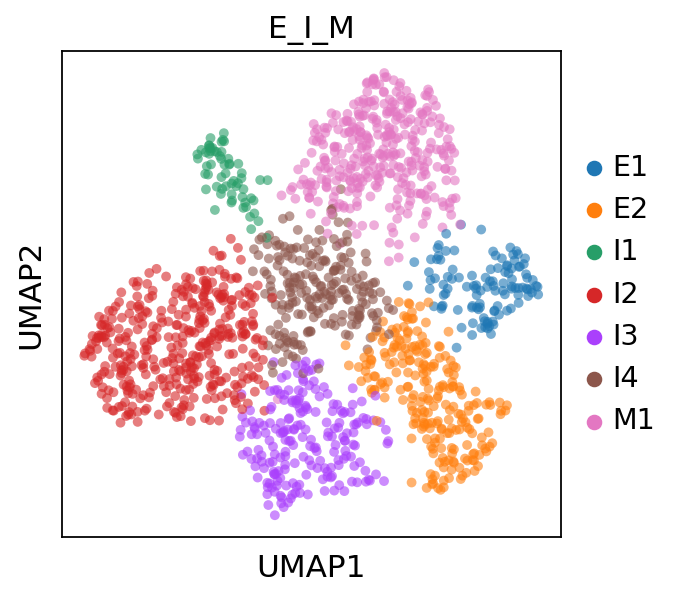

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


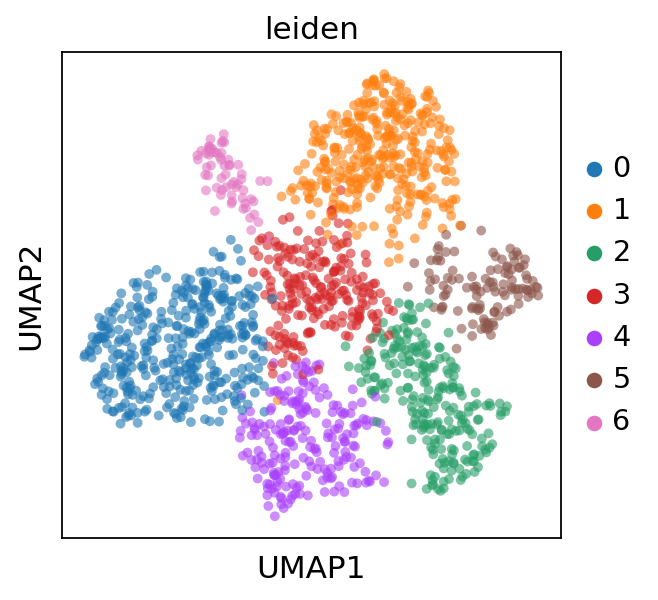

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


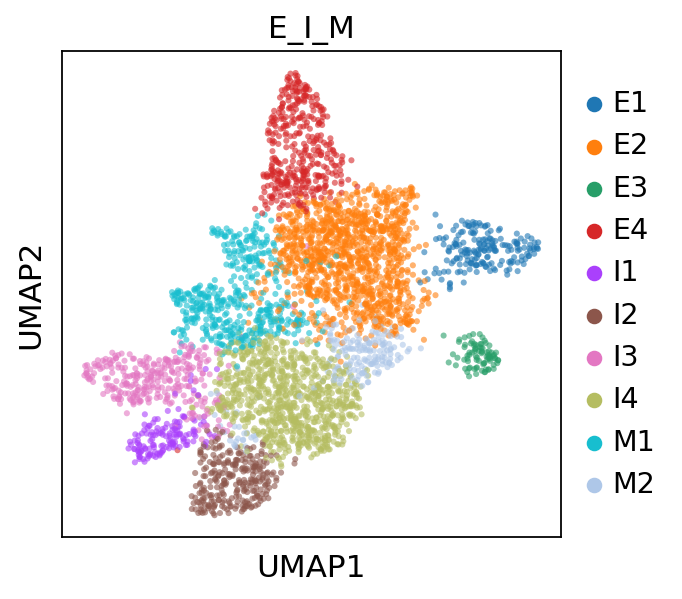

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


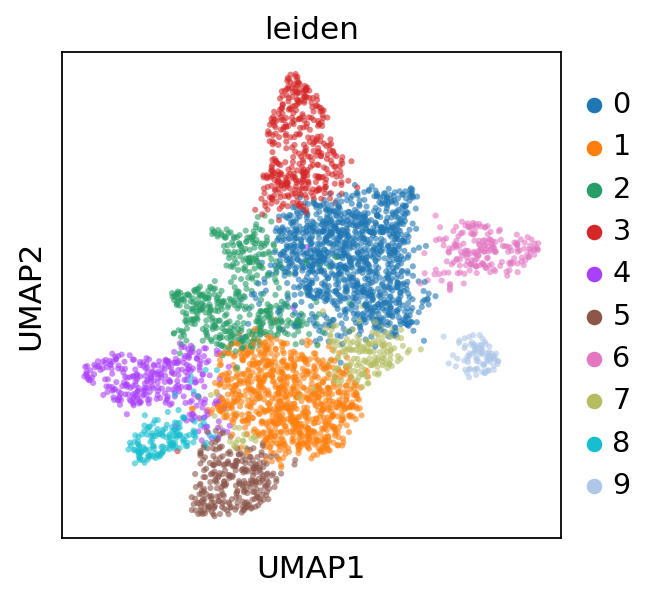

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


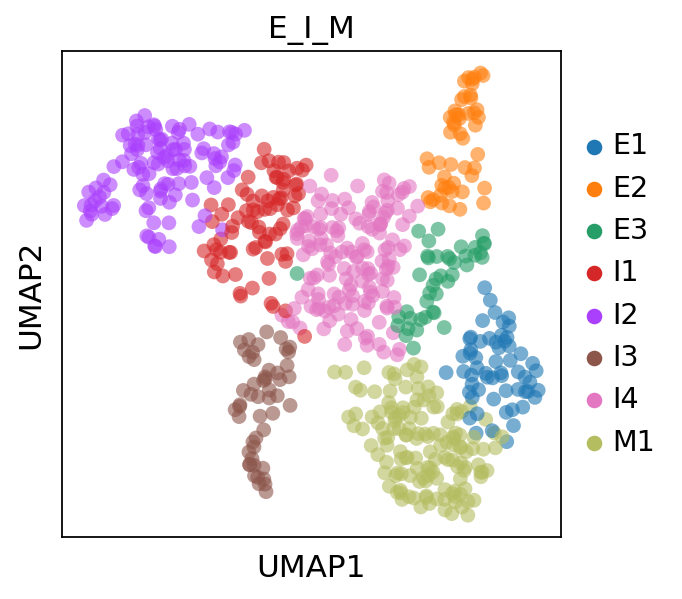

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


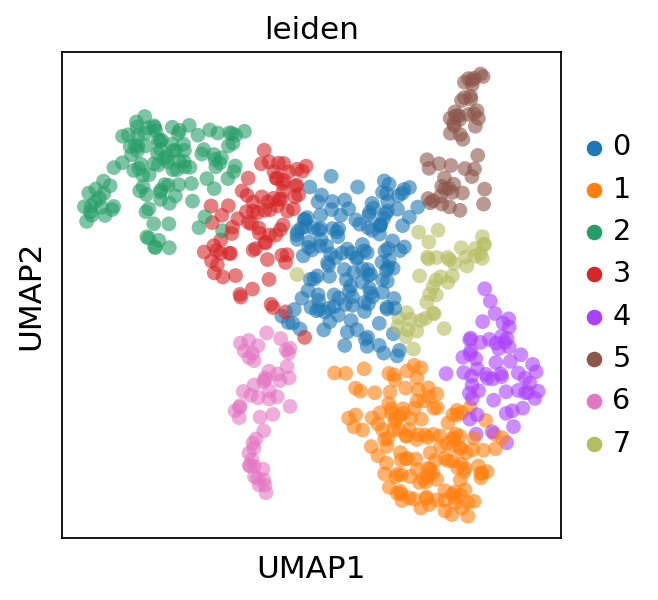

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


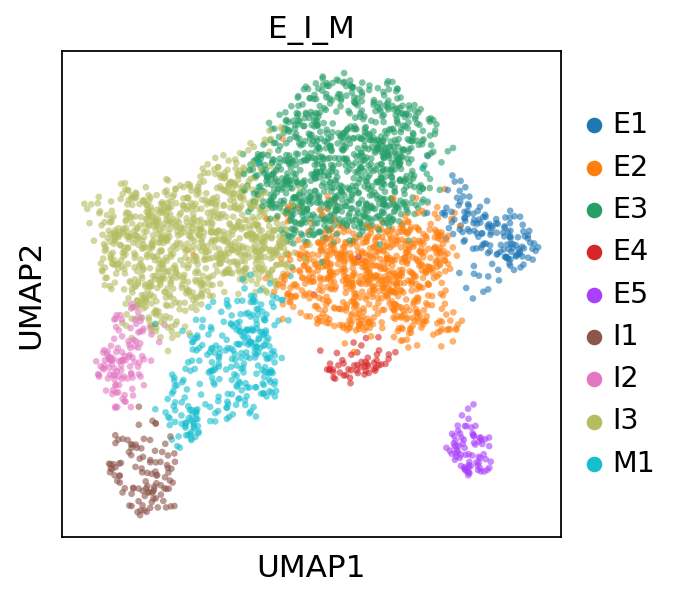

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


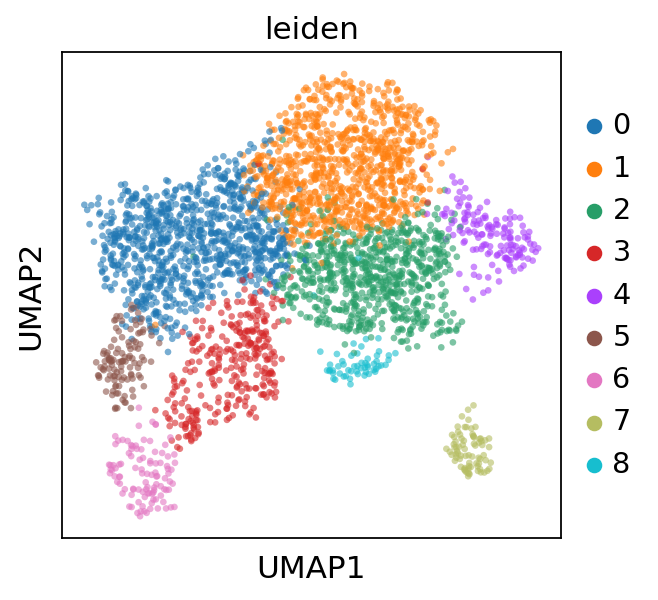

In [24]:
sc.pl.umap(p4_6_doubletfiltered_neuronal, color= "E_I_M", alpha = .6, save='_p4_6_neuronal_leiden.png')
sc.pl.umap(p4_6_doubletfiltered_neuronal, color= "leiden", alpha = .6, save='_p4_6_neuronal_condition.png')

sc.pl.umap(p0_doubletfiltered_neuronal, color= "E_I_M", alpha = .6, save='_p0_neuronal_leiden.png')
sc.pl.umap(p0_doubletfiltered_neuronal, color= "leiden", alpha = .6, save='_p0_neuronal_condition.png')

sc.pl.umap(p10_doubletfiltered_neuronal, color= "E_I_M", alpha = .6, save='_p10_neuronal_leiden.png')
sc.pl.umap(p10_doubletfiltered_neuronal, color= "leiden", alpha = .6, save='_p10_neuronal_condition.png')

sc.pl.umap(p15_doubletfiltered_neuronal, color= "E_I_M", alpha = .6, save='_p15_neuronal_leiden.png')
sc.pl.umap(p15_doubletfiltered_neuronal, color= "leiden", alpha = .6, save='_p15_neuronal_condition.png')

# Dendrogram Timepoint Relationships

- A plot of the dendrogram showing the relationship between the clusters within the timepoint was performed to give an idea of the relationships between clusters

In [25]:
dendrogram_dir = testing_results_dir + 'Dendrogram'
if os.path.exists(dendrogram_dir):
  shutil.rmtree(dendrogram_dir)
os.mkdir(dendrogram_dir)

In [26]:
sc.settings.figdir =  testing_results_dir + 'Dendrogram/'

In [27]:
sc.tl.dendrogram(p0_doubletfiltered_neuronal, groupby= 'E_I_M')
sc.tl.dendrogram(p4_6_doubletfiltered_neuronal, groupby= 'E_I_M')
sc.tl.dendrogram(p10_doubletfiltered_neuronal, groupby= 'E_I_M')
sc.tl.dendrogram(p15_doubletfiltered_neuronal, groupby= 'E_I_M')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_E_I_M']`
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_E_I_M']`
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_E_I_M']`
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_E_I_M']`


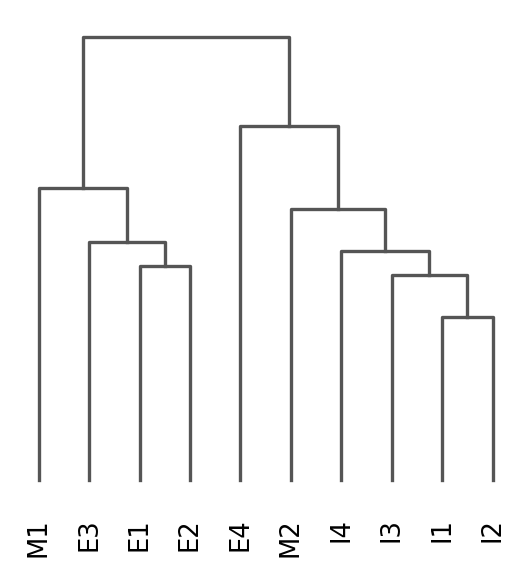

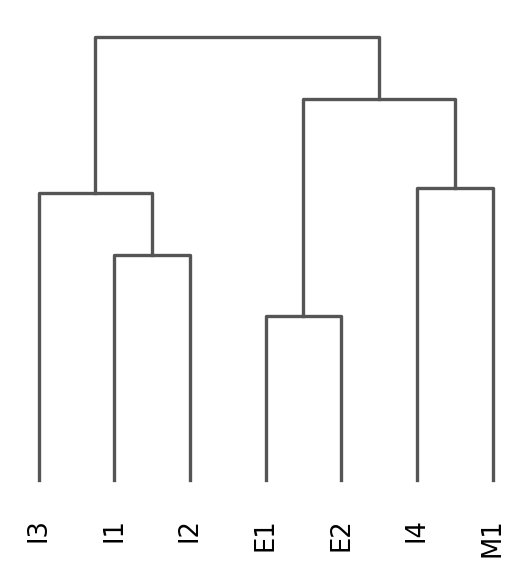

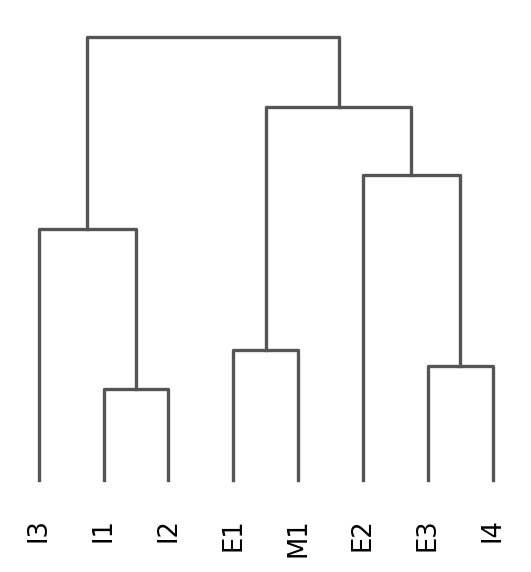

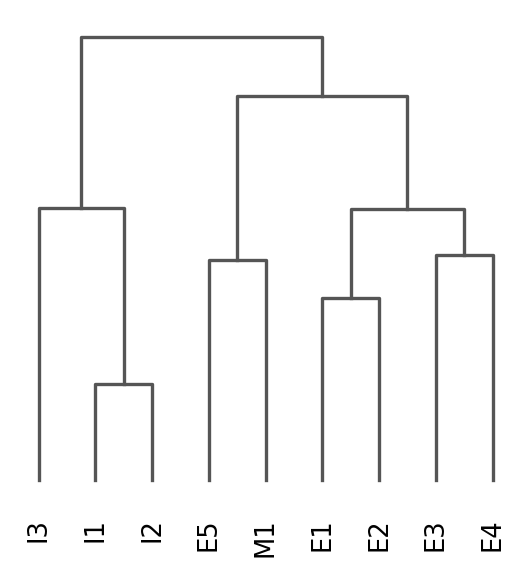

<AxesSubplot: >

In [28]:
sc.pl.dendrogram(p0_doubletfiltered_neuronal, groupby= 'E_I_M', save= '_p0_neuronal.png')
sc.pl.dendrogram(p4_6_doubletfiltered_neuronal,  groupby= 'E_I_M', save= '_p4_6_neuronal.png')
sc.pl.dendrogram(p10_doubletfiltered_neuronal,  groupby= 'E_I_M', save= '_p10_neuronal.png')
sc.pl.dendrogram(p15_doubletfiltered_neuronal,  groupby= 'E_I_M', save= '_p15_neuronal.png')

# Dotplot Triangle

- Uses Unique genes and shared genes to show the closest clusteral relationships between clusters within a timepoint

- Meant for comparison against the clusteral dendrogram and the corresponding relations given by shared genes

- Half of the dotplot triagle represents Inhibitory the other Excitatory.

- Snap25 is meant to unify all the clusters, Gad1/Gad2 and Slc17a6/Cacna2d1 is meant to split the two triangles by Excitatory and Inhibitory

- Excitatory clusters are the upper triangle and Inhibitory is the lower triangle

- The genes going up/down towards the corners of the triangles correspond to the furthering of the clusters relationship to its Excitatory/Inhibitory clustural partners

For example, the image below corresponds to timepoint p15:

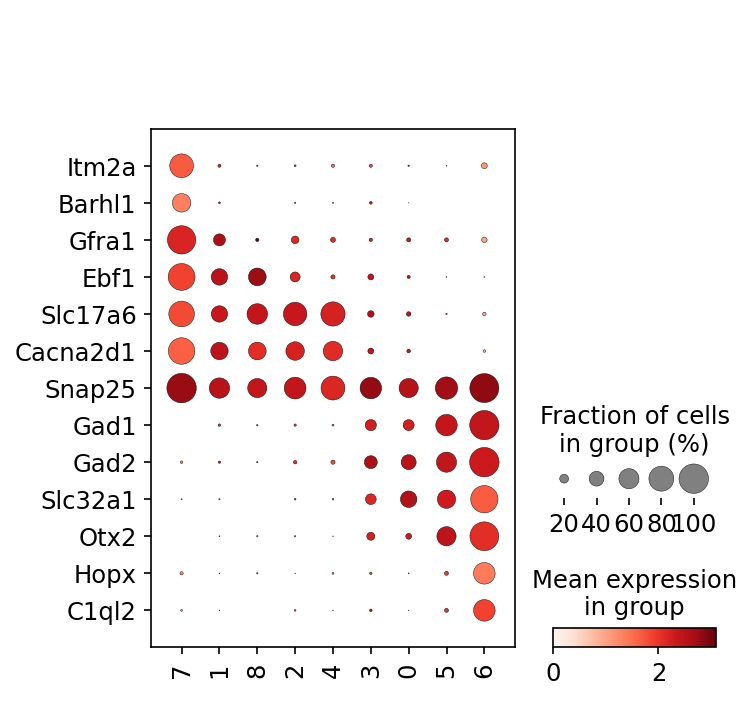

- As an example, in the excitatory triangle (upper triangle), clusters 7,1,8,2, and 4 all highly express Cacna2d1 and Slc17a6.
- From here Ebf1 is shared between clusters 7,1,8, and less so 2, and none for cluster 4.
- Thereafter, Gfra1 is shared between 7 and 1 and not in 8, 2 or 4.
- Lastly we have the genes expressed only in 7.
- This gives a rough idea of which top genes are shared between which cluster within their respective Excitatory/Inhibitory group
- Roughly this gives a idea as to which are a clusters closest neighbors within said groups under the assumption that the Excitatory and Inhibitory clusters are closest to their group

-This differs from the dendrogram as the dendrogram partners clusters that are and aren't within the Excitatory/Inhibitory group


In [29]:
sc.settings.figdir = testing_results_dir + 'Dotplot_Triangle/'

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


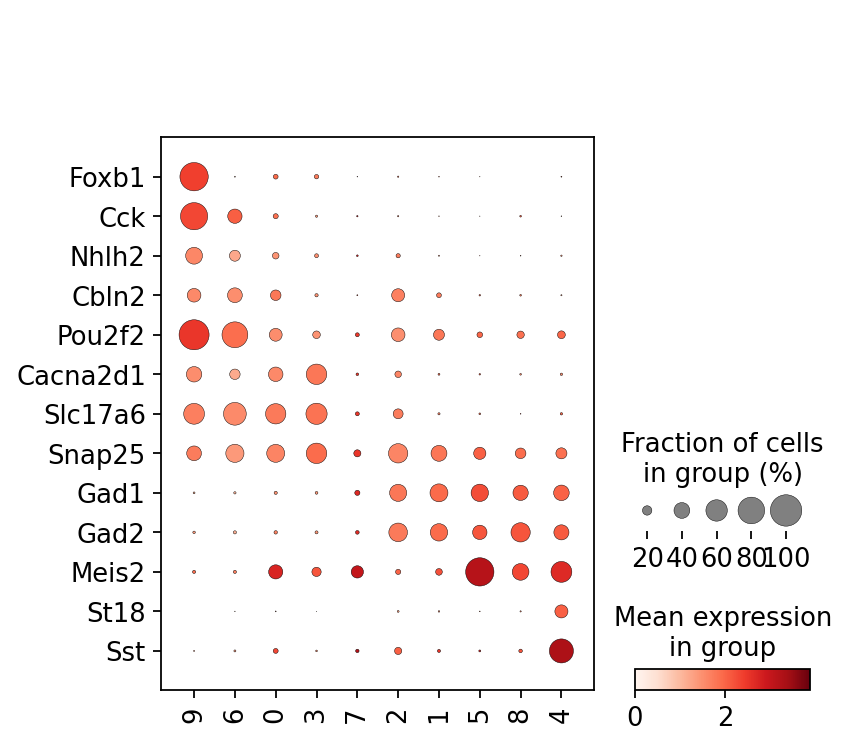

In [30]:
sc.pl.dotplot(p0_doubletfiltered_neuronal, ['Foxb1', 'Cck', 'Nhlh2','Cbln2','Pou2f2','Cacna2d1','Slc17a6','Snap25','Gad1','Gad2','Meis2','St18','Sst'],  mean_only_expressed=True, groupby=['leiden'], categories_order = ['9','6','0','3','7','2','1','5','8', '4'], swap_axes = True, save= '_p0_triangle');

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


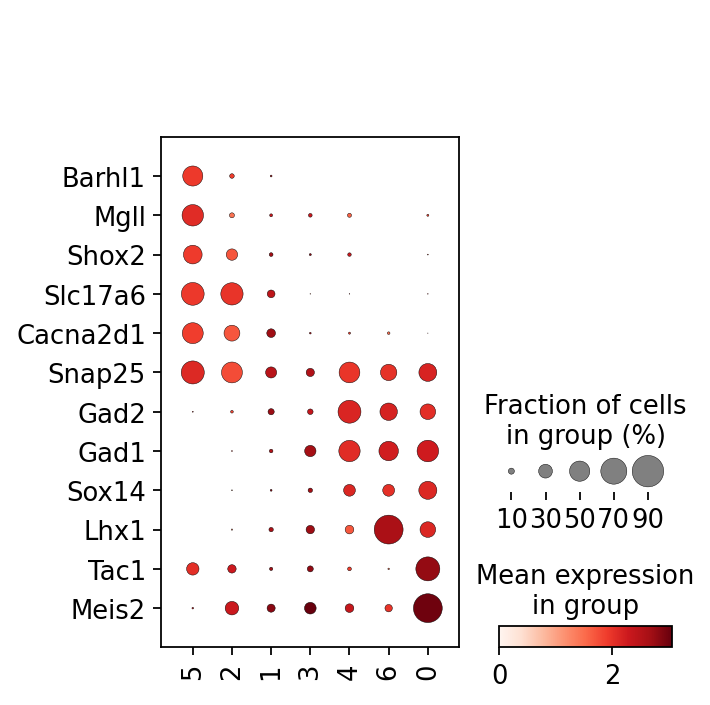

In [31]:
sc.pl.dotplot(p4_6_doubletfiltered_neuronal, ['Barhl1', 'Mgll','Shox2', 'Slc17a6','Cacna2d1','Snap25','Gad2','Gad1','Sox14','Lhx1','Tac1','Meis2'],  mean_only_expressed=True, groupby=['leiden'], categories_order = ['5','2','1','3','4','6','0'], swap_axes = True, save= '_p4_6_triangle');

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


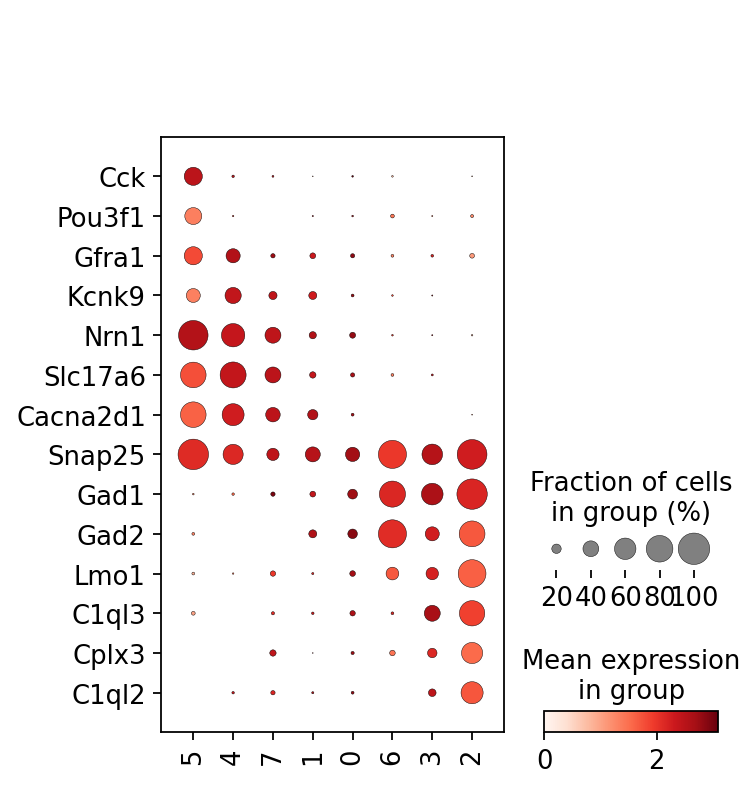

In [32]:
sc.pl.dotplot(p10_doubletfiltered_neuronal, ['Cck','Pou3f1' ,'Gfra1', 'Kcnk9','Nrn1','Slc17a6','Cacna2d1','Snap25','Gad1','Gad2','Lmo1','C1ql3','Cplx3','C1ql2'],  mean_only_expressed=True, groupby=['leiden'], categories_order = ['5','4','7','1','0','6','3','2'], swap_axes = True, save= '_p10_triangle');

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


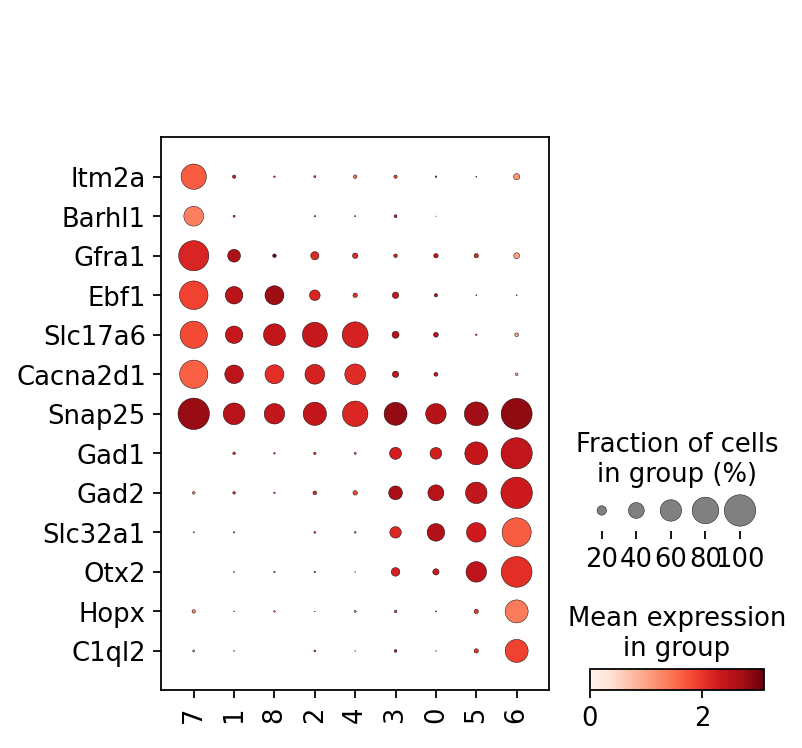

In [33]:
sc.pl.dotplot(p15_doubletfiltered_neuronal, ['Itm2a','Barhl1','Gfra1','Ebf1','Slc17a6','Cacna2d1','Snap25','Gad1','Gad2','Slc32a1','Otx2','Hopx','C1ql2'],  mean_only_expressed=True, groupby=['leiden'], categories_order = ['7','1','8','2','4','3','0','5','6'], swap_axes = True, save= '_p15_triangle');

In [34]:
import itertools

# Rank Differentially Expressed Genes

- The top 20 differentially expressed genes of all four timepoints are ranked and then plotted with respect to all other clusters for visualization

- The method used for ranking is by t-test

In [35]:
rank_diff_genes_dir = testing_results_dir + 'Rank_Diff_Genes'
if os.path.exists(rank_diff_genes_dir):
  shutil.rmtree(rank_diff_genes_dir)
os.mkdir(rank_diff_genes_dir)

In [36]:
sc.settings.figdir = testing_results_dir+ 'Rank_Diff_Genes'

ranking genes
    finished (0:00:00)


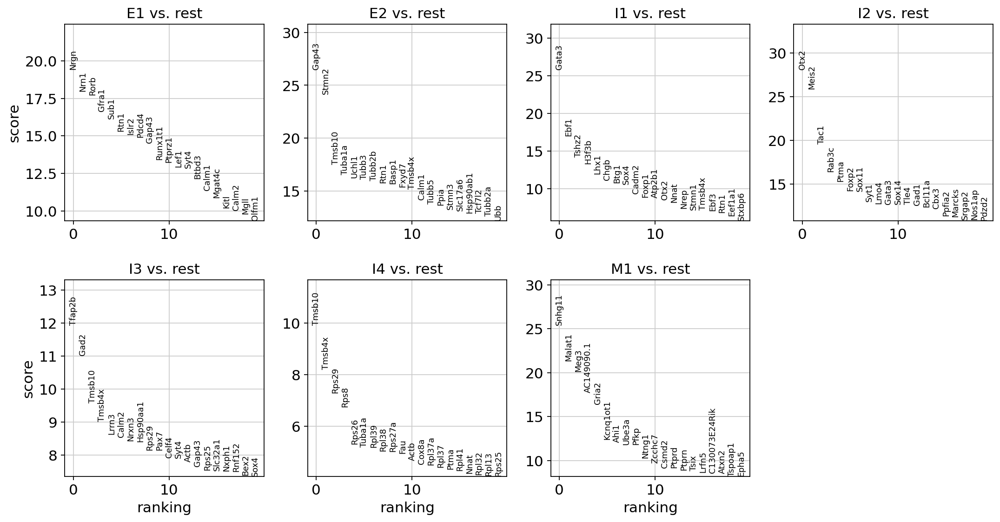

ranking genes
    finished (0:00:00)


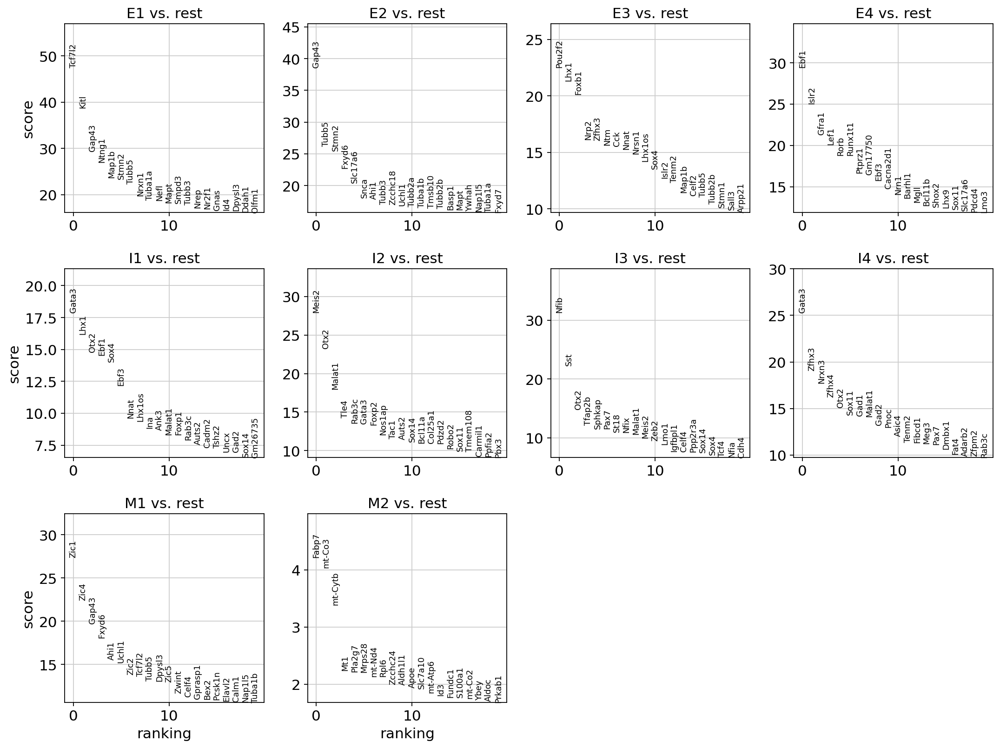

ranking genes
    finished (0:00:00)


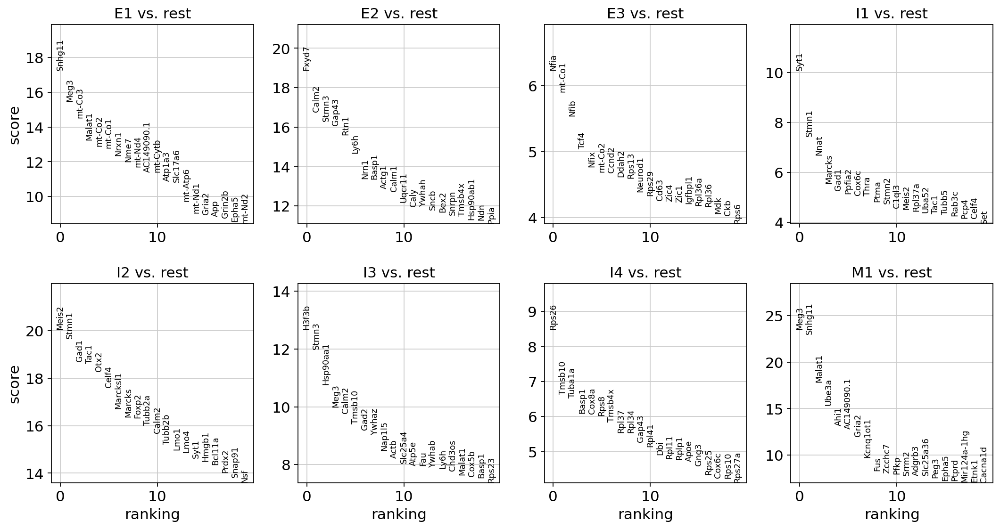

ranking genes
    finished (0:00:00)


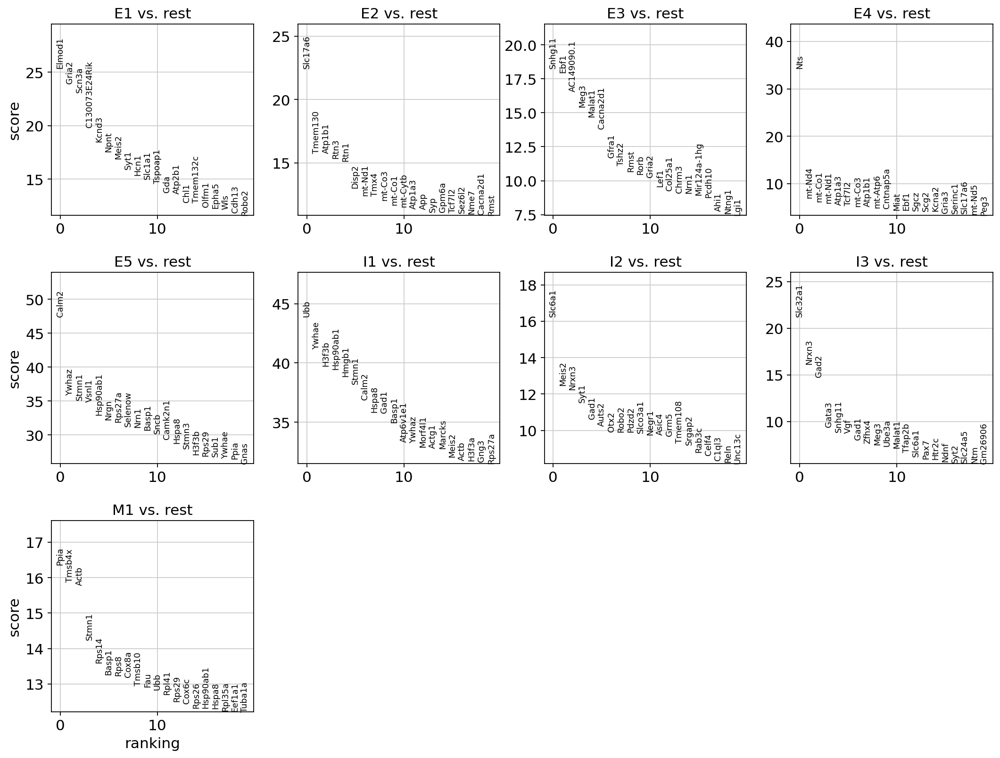

In [37]:
sc.tl.rank_genes_groups(p4_6_doubletfiltered_neuronal, groupby="E_I_M",  use_raw=None, method='t-test')
sc.pl.rank_genes_groups(p4_6_doubletfiltered_neuronal, n_genes=20, sharey=False, save = 'p4_6_rank_diff_genes.png')

sc.tl.rank_genes_groups(p0_doubletfiltered_neuronal, groupby="E_I_M",  use_raw=None, method='t-test')
sc.pl.rank_genes_groups(p0_doubletfiltered_neuronal, n_genes=20, sharey=False, save = 'p0_rank_diff_genes.png')

sc.tl.rank_genes_groups(p10_doubletfiltered_neuronal, groupby="E_I_M",  use_raw=None, method='t-test')
sc.pl.rank_genes_groups(p10_doubletfiltered_neuronal, n_genes=20, sharey=False, save = 'p10_rank_diff_genes.png')

sc.tl.rank_genes_groups(p15_doubletfiltered_neuronal, groupby="E_I_M",  use_raw=None, method='t-test')
sc.pl.rank_genes_groups(p15_doubletfiltered_neuronal, n_genes=20, sharey=False, save = 'p15_rank_diff_genes.png')

# Differentially Expressed Genes Dataframes

- All differentially expressed genes for all timepoionts are visually listed by their respective dataframe

- These differentially expressed genes are siphoned according to a p-value of
.05 and of which only have a positive logfold change

In [38]:
diff_dataFrame_p0_positive = sc.get.rank_genes_groups_df(p0_doubletfiltered_neuronal,  group = None, log2fc_min = 0, log2fc_max= None,  pval_cutoff=0.09)
diff_dataFrame_p0_strict_cutoff_positive = sc.get.rank_genes_groups_df(p0_doubletfiltered_neuronal,  group = None, log2fc_min = 0, log2fc_max= None, pval_cutoff=0.05)
diff_dataFrame_p0_positive

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,E1,Tcf7l2,47.545135,4.587759,1.698475e-137,9.140061e-134
1,E1,Kitl,38.777000,6.025530,1.594955e-94,4.291493e-91
2,E1,Gap43,29.406693,1.585212,6.502171e-113,2.624276e-109
3,E1,Ntng1,26.966215,3.253912,1.263719e-71,1.200087e-68
4,E1,Map1b,23.664492,1.117396,1.178818e-72,1.189428e-69
...,...,...,...,...,...,...
9251,M2,Mrps28,2.207080,1.176044,2.848476e-02,5.475150e-02
9252,M2,mt-Nd4,2.136824,0.291847,3.385567e-02,6.307743e-02
9253,M2,Rpl6,2.131398,0.280376,3.429149e-02,6.377166e-02
9254,M2,Zcchc24,1.996066,3.601206,4.736044e-02,8.449407e-02


In [39]:
diff_dataFrame_p4_6_positive = sc.get.rank_genes_groups_df(p4_6_doubletfiltered_neuronal,  group = None, log2fc_min = 0, log2fc_max= None,  pval_cutoff=0.09)
diff_dataFrame_p4_6_strict_cutoff_positive = sc.get.rank_genes_groups_df(p4_6_doubletfiltered_neuronal,  group = None, log2fc_min = 0, log2fc_max= None, pval_cutoff=0.05)
diff_dataFrame_p4_6_positive

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,E1,Nrgn,19.423296,5.267528,1.352661e-38,1.985215e-35
1,E1,Nrn1,17.957159,4.473740,1.062843e-35,1.009326e-32
2,E1,Rorb,17.724497,3.899384,6.167540e-36,6.223048e-33
3,E1,Gfra1,16.624716,4.661506,1.137268e-32,7.650024e-30
4,E1,Sub1,16.140980,1.861500,4.478017e-38,6.024425e-35
...,...,...,...,...,...,...
5382,M1,Lss,2.215063,1.090044,2.731056e-02,8.935988e-02
5383,M1,A530017D24Rik,2.213381,1.369025,2.743954e-02,8.961326e-02
5384,M1,Col15a1,2.212507,3.477463,2.758294e-02,8.995208e-02
5385,M1,Plxna3,2.212075,1.221617,2.752226e-02,8.981591e-02


In [40]:
diff_dataFrame_p10_positive = sc.get.rank_genes_groups_df(p10_doubletfiltered_neuronal,  group = None, log2fc_min = 0, log2fc_max= None,  pval_cutoff=0.09)
diff_dataFrame_p10_strict_cutoff_positive = sc.get.rank_genes_groups_df(p10_doubletfiltered_neuronal,  group = None, log2fc_min = 0, log2fc_max= None, pval_cutoff=0.05)
diff_dataFrame_p10_positive

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,E1,Snhg11,17.265034,3.272790,8.941657e-37,4.811804e-33
1,E1,Meg3,15.466525,3.442132,4.116449e-35,1.329119e-31
2,E1,mt-Co3,14.510261,2.163522,1.264836e-26,1.570732e-23
3,E1,Malat1,13.244276,3.125692,2.200543e-27,3.229598e-24
4,E1,mt-Co2,12.905224,2.587446,4.449664e-22,2.660569e-19
...,...,...,...,...,...,...
7536,M1,Uvssa,2.327091,1.248230,2.114885e-02,8.788341e-02
7537,M1,Sec22a,2.326703,1.349767,2.118393e-02,8.793863e-02
7538,M1,Abca5,2.326680,1.209116,2.118154e-02,8.793863e-02
7539,M1,Gm10578,2.325755,4.405028,2.143290e-02,8.874398e-02


In [41]:
diff_dataFrame_p15_positive = sc.get.rank_genes_groups_df(p15_doubletfiltered_neuronal,  group = None, log2fc_min = 0, log2fc_max= None,  pval_cutoff=0.09)
diff_dataFrame_p15_strict_cutoff_positive = sc.get.rank_genes_groups_df(p15_doubletfiltered_neuronal,  group = None, log2fc_min = 0, log2fc_max= None, pval_cutoff=0.05)
diff_dataFrame_p15_positive

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,E1,Elmod1,25.359461,3.335739,6.036715e-60,3.248558e-56
1,E1,Gria2,23.932543,1.851184,8.724270e-63,7.042231e-59
2,E1,Scn3a,23.116711,3.386997,5.895152e-54,1.903427e-50
3,E1,C130073E24Rik,19.830578,3.985420,1.409298e-44,2.527967e-41
4,E1,Kcnd3,18.487623,4.306322,8.308081e-41,1.219324e-37
...,...,...,...,...,...,...
12936,M1,Bpgm,2.121382,1.148543,3.464765e-02,8.889887e-02
12937,M1,Fam183b,2.120292,2.074597,3.473616e-02,8.908350e-02
12938,M1,Ncoa5,2.118896,0.747915,3.481550e-02,8.924444e-02
12939,M1,Fez1,2.118335,0.498622,3.486001e-02,8.934435e-02


In [42]:
diff_dataFrame_timePoints_strict = [diff_dataFrame_p0_strict_cutoff_positive, diff_dataFrame_p4_6_strict_cutoff_positive, diff_dataFrame_p10_strict_cutoff_positive, diff_dataFrame_p15_strict_cutoff_positive]


# Harmony Cluster Labels

- Cluster labels are assigned for each cell within each cluster and timepoint.

- The label is as follows     cluster_number__timepint

- The purpose for these labels is to know which cells belongs to which timepoint and which cluster which will be useful for other cellular categorizations as well as the harmony integration which is done for the timepoint correlation analysis

In [43]:
Labeler.Harmony_Cluster_Labels_Constructor(timepoints_anndata, timepoints_anndata_names, E_I_M_labels_dict)

# Inhibitory, Excitatory, and Mixed Clusters

- The clusters are listed by their Inhibitory, Excitatory, and Mixed representation and added into lists

- Furthermore a list of all anndata objects are created along with their respective names

- The anndata objects along with the respective Inhibitory, Excitatory, and Mixed listing of the clusters are used to label each cell within the four respective timepoints within the anndata object

- Using these labels the UMAPs are plotted with respect to these labelings

In [44]:
Inhibitory = ['I2_p4/6_neuronal', 'I1_p4/6_neuronal', 'I4_p4/6_neuronal', 'I3_p4/6_neuronal', 'I3_p15_neuronal', 'I2_p15_neuronal', 'I1_p15_neuronal', 'I4_p0_neuronal', 'I1_p0_neuronal', 'I3_p0_neuronal', 'I2_p0_neuronal', 'I2_p10_neuronal', 'I1_p10_neuronal', 'I3_p10_neuronal', 'I4_p10_neuronal']
Excitatory = ['E1_p4/6_neuronal', 'E2_p4/6_neuronal', 'E3_p15_neuronal', 'E2_p15_neuronal', 'E4_p15_neuronal', 'E1_p15_neuronal', 'E5_p15_neuronal', 'E4_p0_neuronal', 'E2_p0_neuronal', 'E1_p0_neuronal', 'E3_p0_neuronal', 'E2_p10_neuronal', 'E3_p10_neuronal', 'E1_p10_neuronal']
Mix = ['M1_p4/6_neuronal', 'M1_p15_neuronal', 'M2_p0_neuronal', 'M1_p0_neuronal', 'M1_p10_neuronal']

In [45]:
Labeler.Inhib_Excitatory_Anndata_Labels_Constructor(timepoints_anndata, Inhibitory, Excitatory, Mix)

In [46]:
all_timepoints_excitatory_inhibitory_mix_percentage = {}
e_i_m = ['Excitatory', 'Inhibitory','Mix']

for anndata, name in zip(timepoints_anndata, timepoints_anndata_names):

  e_i_m_dict = {}

  for clust_category in e_i_m:
    curr_counts = 0
    total_counts = 0

    for transcripts in anndata.obs.index:
      if anndata.obs.loc[transcripts]['Inhibitory_Excitatory_Mix'] == clust_category:
        curr_counts += 1
      total_counts +=1

    category_percentage = curr_counts/total_counts
    e_i_m_dict[clust_category] = category_percentage*100

  all_timepoints_excitatory_inhibitory_mix_percentage[name] = e_i_m_dict

for timepoint in all_timepoints_excitatory_inhibitory_mix_percentage:
  print(timepoint+':'+'\n')
  category_dict = all_timepoints_excitatory_inhibitory_mix_percentage.get(timepoint)
  for cluster_category in category_dict:
    print(cluster_category+' Percentage: '+str(round(category_dict.get(cluster_category), 2)))
  print('\n')

p0:

Excitatory Percentage: 44.65
Inhibitory Percentage: 39.0
Mix Percentage: 16.35


p4/6:

Excitatory Percentage: 22.22
Inhibitory Percentage: 55.83
Mix Percentage: 21.96


p10:

Excitatory Percentage: 22.09
Inhibitory Percentage: 57.0
Mix Percentage: 20.91


p15:

Excitatory Percentage: 56.68
Inhibitory Percentage: 34.28
Mix Percentage: 9.04




In [47]:
Inhib_Excitatory_Mix_dir = testing_results_dir + 'Inhibitory_Excitatory_Mix_Umap/'

if os.path.exists(Inhib_Excitatory_Mix_dir):
  shutil.rmtree(Inhib_Excitatory_Mix_dir)
os.mkdir(Inhib_Excitatory_Mix_dir)

In [48]:
sc.settings.figdir = Inhib_Excitatory_Mix_dir

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


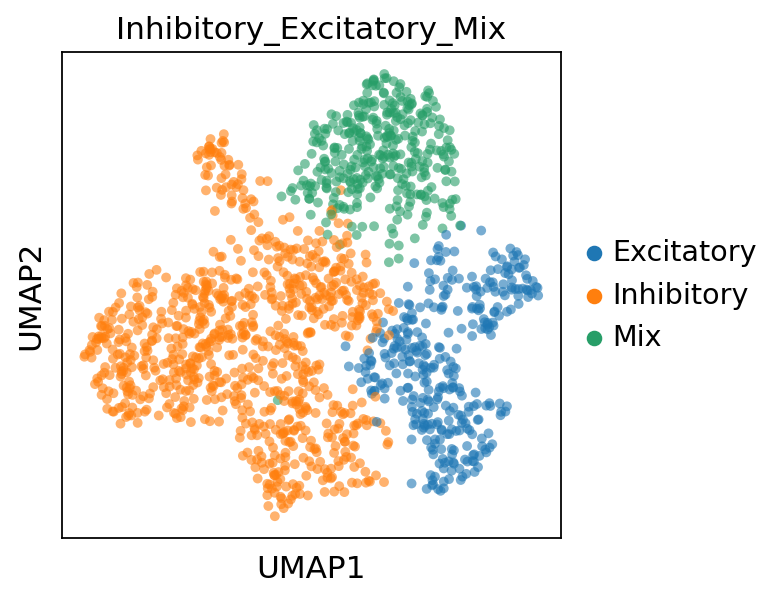

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


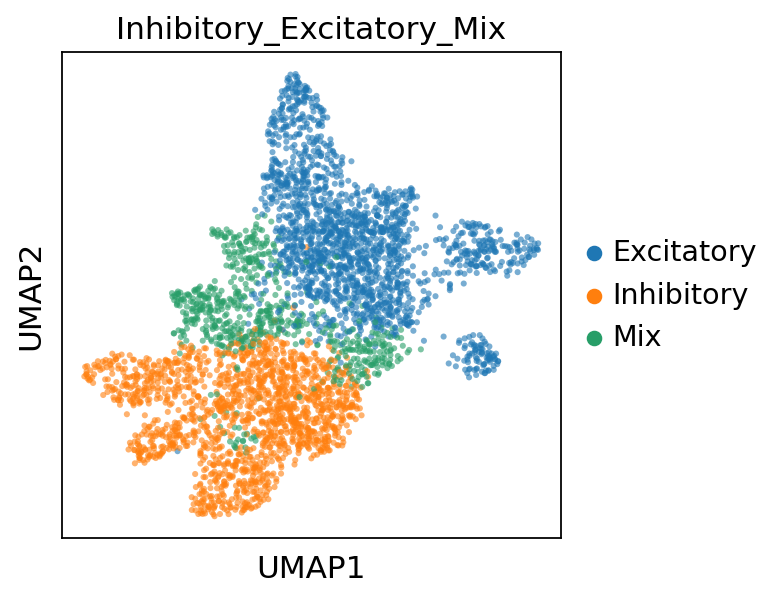

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


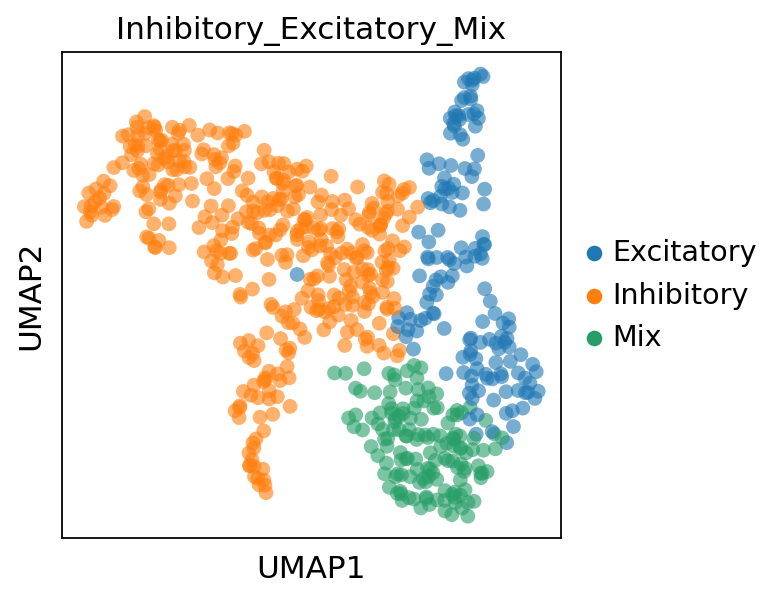

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


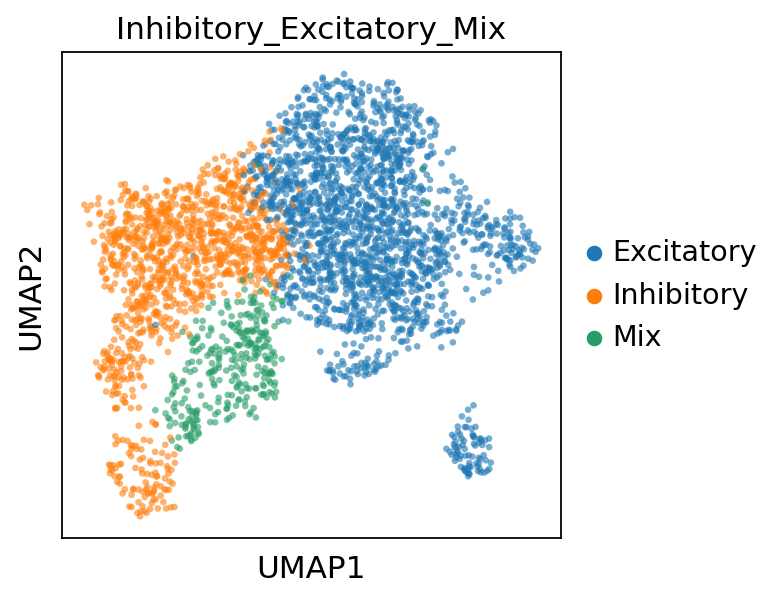

In [49]:
sc.pl.umap(p4_6_doubletfiltered_neuronal, color= "Inhibitory_Excitatory_Mix", alpha = .6, save='_p4_6_neuronal_Inhibitory_Excitatory_Mix.png')

sc.pl.umap(p0_doubletfiltered_neuronal, color= "Inhibitory_Excitatory_Mix", alpha = .6, save='_p0_neuronal_Inhibitory_Excitatory_Mix.png')

sc.pl.umap(p10_doubletfiltered_neuronal, color= "Inhibitory_Excitatory_Mix", alpha = .6, save='_p10_neuronal_Inhibitory_Excitatory_Mix.png')

sc.pl.umap(p15_doubletfiltered_neuronal, color= "Inhibitory_Excitatory_Mix", alpha = .6, save='_p15_neuronal_Inhibitory_Excitatory_Mix.png')

# Unique/Standard Deviation Ranked Genes

- The Gene_Filtering function ipynb file is accessed to process the differentially expressed genes into their respective uniqueness according to their clusters
- Uniqueness is determined through a Ratio Metric Mean Expression Ranking


- The Ranking is done as follows:

- Extract highly differentially expressed genes (p<.05) for each cluster

- For each gene the mean expression for the cluster in question is found (ME_C), and the average expression level of the gene, for all other clusters is also found (ME_A)

- (ME_C) / (ME_A) = ratio of expression of a gene vs all other clusters

- The process is repeated for all genes for all clusters, and rank the genes from highest ratio to lowest


In [50]:
if not Quick_Run:
  all_timepoint_unique_genes_dict, all_timepoint_standard_deviation_genes_dict = Gene_Filtering.Unique_SD_Genes_Constructor(timepoints_anndata_names, diff_dataFrame_timePoints_strict, timepoints_anndata)

In [51]:
print(all_timepoint_standard_deviation_genes_dict)

{'p0': [('Gata3', 0.3255170923587514), ('Otx2', 0.3221911501704034), ('Lhx1', 0.3063093215458482), ('Zfhx3', 0.29827424923980855), ('Islr2', 0.2978367547666809), ('Tcf7l2', 0.29701976185942514), ('Kitl', 0.28507338954190736), ('Pou2f2', 0.281494233809683), ('Ebf1', 0.2806560888780282), ('Zic1', 0.2692828582613462), ('Slc17a6', 0.2673752446760167), ('Foxb1', 0.255830195477082), ('Gap43', 0.25267974055502357), ('Meis2', 0.25152449048540004), ('Ntng1', 0.25086813163629557), ('Cck', 0.25021147659613335), ('Tuba1b', 0.24219372921439955), ('Lhx1os', 0.24054449506623726), ('Nrn1', 0.23651718794154533), ('Nfib', 0.23372725899032135), ('Snhg11', 0.23024719999761784), ('Nrp2', 0.22868409647265509), ('Nefl', 0.22373598863683342), ('Ebf3', 0.2228474160854868), ('Nrsn1', 0.22272891272066053), ('Rac3', 0.22204856456812533), ('Lhx9', 0.22024048129582968), ('Arpp21', 0.21960126220239423), ('Hmgcs1', 0.2182839815133933), ('6330403K07Rik', 0.2178212317943623), ('Ywhah', 0.2170904445318168), ('Calm3', 0.

In [52]:
print(all_timepoint_unique_genes_dict)

{'p0': {'E4': [('Hgf', 291.6163712009631), ('Tmem232', 68.18776616603941), ('Hhip', 54.16707226255541), ('Nek11', 30.30958753115731), ('Cabp7', 22.297447482066584), ('Barhl1', 20.50663899431586), ('6430573F11Rik', 14.507669450976648), ('Wnt7b', 14.083640636895868), ('Pcp2', 13.955541524986158), ('Sox6', 13.854294645685354), ('Bnc2', 13.753423075035842), ('Gm30373', 13.032548531662767), ('Cfap77', 12.55545664955406), ('Ak8', 12.015523772105324), ('Dkk2', 11.98843527904171), ('Ebf2', 11.946159571841807), ('2600014E21Rik', 11.084985487272487), ('Hmcn1', 10.635881576999203), ('Otof', 10.153240634596315), ('Neurod2', 8.940086482280146), ('Prkg2', 8.491416084217331), ('Pou3f1', 8.328677036473302), ('Mgll', 8.092761065316346), ('Tacr1', 7.68522085031486), ('Adra2a', 7.660674313325818), ('Gm43352', 7.443269268535446), ('Crym', 7.440847232975945), ('Nptx2', 7.356620175154336), ('Megf11', 7.208428221100489), ('Barhl2', 6.96537146306078), ('Pde5a', 6.96525803124976), ('Cpne9', 6.957530851381318),

# Cluster Distinction

- All the unique genes are further filtered accordingly, these filterings are meant to orgainze each cluster by the criteria of True Distinct, Relative Distinct, and Non Distinct

The Definitions and Categorization is as follows:


# True Distinct

- A True Distinct cluster has been defined as being a cluster that has at least one gene expressed in >=35% of all the cell within said cluster

AND

- Has at least (2X) the percentage of cells of than the mean percentage of all other clusters

OR

- Has at least (2X) the mean expression than the mean, mean expression, of all other clusters


# Relative Distinct

- A Relative Distinct cluster has been defined as being a cluster that has at least one gene
expressed in >=10% but <=35% of all the cells within said cluster

AND

- Has at least (2X) the percentage of cells of than the mean percentage of all other clusters

OR

- Has at least (2X) the mean expression than the mean, mean expression, of all other clusters


# Non Distinct


- A Non Distinct cluster has been defined as having no genes that fit the criteria above



After obtaining these values the dotplots for all True and Relative Distinct Clusters are plotted and the cells are labeled accordingly. Using these labels the UMAPs are plotted accordingly.

In [53]:
timepoint_raw_data = [p4_6_doubletfiltered_neuronal.raw, p0_doubletfiltered_neuronal.raw, p10_doubletfiltered_neuronal.raw, p15_doubletfiltered_neuronal.raw]


timepoint_pair_name_tuples = [('p0','p4/6'),('p4/6','p10'),('p10','p15')]
timepoint_pair_anndata_tuples = [(p0_doubletfiltered_neuronal, p4_6_doubletfiltered_neuronal),(p4_6_doubletfiltered_neuronal, p10_doubletfiltered_neuronal),(p10_doubletfiltered_neuronal, p15_doubletfiltered_neuronal)]

cluster_distinction_path = testing_results_dir + 'Cluster_Distinction'




In [54]:
if os.path.exists(cluster_distinction_path):
  shutil.rmtree(cluster_distinction_path)
os.mkdir(cluster_distinction_path)

In [55]:
if not Quick_Run:
  all_timepoint_true_relative_distinct_unique_genes_dict, all_timepoint_all_unique_genes_dict = Distinction.True_Relative_Non_Distinct_Unique_Genes_Constructor(all_timepoint_unique_genes_dict, timepoints_anndata, timepoints_anndata_names)

In [56]:
print(all_timepoint_true_relative_distinct_unique_genes_dict)

{'p0': {'E4': ('True Distinct', ['Gfra1', 'Gm17750', 'Bcl11b']), 'E1': ('True Distinct', ['S100a10', 'Kitl', 'Prox1', 'Sox2', 'Fign', 'Nefm', 'Mef2c', 'Mast4', 'Nr2f1', 'Pdgfa', 'Ntng1', 'Klf6', 'Rnf220', 'AI593442', 'Atp2c1', 'Chst2', 'Mef2a']), 'E3': ('True Distinct', ['Sall3', 'Foxb1', 'Cck', 'Onecut2', 'Rprm', 'Rph3a', 'Nrp1', 'Nrp2']), 'I4': ('Relative Distinct', ['Dmbx1', 'Fibcd1']), 'I3': ('True Distinct', ['Sst', 'Nfib']), 'E2': ('Relative Distinct', ['En1']), 'M1': ('Relative Distinct', ['Pax6', 'Otx1', 'Pax3', 'Zic3']), 'I1': ('Relative Distinct', ['Gli3', 'Synpr', 'Adamts5']), 'I2': ('Relative Distinct', ['C1ql3', 'Nos1ap', 'Pcdh20', 'Tmem108', 'Carmil1', 'Pcbp3', 'Igf1']), 'M2': ('Non Distinct', [])}, 'p4/6': {'E1': ('True Distinct', ['Kitl', 'Mgll', 'Islr2', 'Gfra1', 'Kctd12', 'Rorb', 'Lef1', 'Btbd3', 'Pam', 'Mgat4c', 'Thsd7a', 'Ptprz1']), 'M1': ('Relative Distinct', ['Gm26906', 'Nsmaf', 'AY036118']), 'I3': ('True Distinct', ['Tfap2b']), 'E2': ('True Distinct', ['Tcf7l2'])

In [57]:
all_timepoint_distinction_dict =  Distinction.True_Relative_Non_Distinct_Data_Output(all_timepoint_true_relative_distinct_unique_genes_dict, timepoints_anndata, cluster_distinction_path, timepoints_anndata_names)

Output hidden; open in https://colab.research.google.com to view.

In [58]:
Labeler.True_Relative_Non_Distinct_Labels_Constructor(timepoints_anndata, timepoints_anndata_names, all_timepoint_distinction_dict)

In [59]:
for timepoint in all_timepoint_true_relative_distinct_unique_genes_dict:
  cluster_dict = all_timepoint_true_relative_distinct_unique_genes_dict.get(timepoint)
  print(timepoint+'\n')
  for cluster in cluster_dict:
    print('Cluster '+cluster+':'+'\n')
    gene_list = cluster_dict.get(cluster)[1]
    for gene in gene_list:
      print(gene)
    print('\n')
  print('\n')



p0

Cluster E4:

Gfra1
Gm17750
Bcl11b


Cluster E1:

S100a10
Kitl
Prox1
Sox2
Fign
Nefm
Mef2c
Mast4
Nr2f1
Pdgfa
Ntng1
Klf6
Rnf220
AI593442
Atp2c1
Chst2
Mef2a


Cluster E3:

Sall3
Foxb1
Cck
Onecut2
Rprm
Rph3a
Nrp1
Nrp2


Cluster I4:

Dmbx1
Fibcd1


Cluster I3:

Sst
Nfib


Cluster E2:

En1


Cluster M1:

Pax6
Otx1
Pax3
Zic3


Cluster I1:

Gli3
Synpr
Adamts5


Cluster I2:

C1ql3
Nos1ap
Pcdh20
Tmem108
Carmil1
Pcbp3
Igf1


Cluster M2:





p4/6

Cluster E1:

Kitl
Mgll
Islr2
Gfra1
Kctd12
Rorb
Lef1
Btbd3
Pam
Mgat4c
Thsd7a
Ptprz1


Cluster M1:

Gm26906
Nsmaf
AY036118


Cluster I3:

Tfap2b


Cluster E2:

Tcf7l2


Cluster I2:

Tac1
Meis2


Cluster I1:

Lhx1
Foxp1


Cluster I4:





p10

Cluster I2:

C1ql2
Hs3st3b1
Cplx3
Cbln4
Lmo1
Pcbp3
Rapgef5
Foxp2
Igf1
Cxcl14
Tmem108
Adgrb1
Cd24a
Tspan5
1700025G04Rik
St8sia2
Gria1
Cdkl5
Slco3a1
Tle4
Bcl11a
Col25a1
Unc13c
Nrp2


Cluster E1:

Mirg
Stk38


Cluster M1:



Cluster E2:

Vat1l
Lmo3
Pole4
Vldlr
Gabra5
AI413582
Cdkl2
Mrps15
Ckmt1
Ubxn6
Car11
Arid1b
Pdg

In [60]:
all_timepoints_true_relative_non_distinct_percentage = {}
t_r_n = ['True_Distinct', 'Relative_Distinct','Non_Distinct']

for anndata, name in zip(timepoints_anndata, timepoints_anndata_names):

  t_r_n_dict = {}

  for clust_category in t_r_n:
    curr_counts = 0
    total_counts = 0

    for transcripts in anndata.obs.index:
      if anndata.obs.loc[transcripts]['Distinction'] == clust_category:
        curr_counts += 1
      total_counts +=1

    category_percentage = curr_counts/total_counts
    t_r_n_dict[clust_category] = category_percentage*100

  all_timepoints_true_relative_non_distinct_percentage[name] = t_r_n_dict

for timepoint in all_timepoints_true_relative_non_distinct_percentage:
  print(timepoint+':'+'\n')
  category_dict = all_timepoints_true_relative_non_distinct_percentage.get(timepoint)
  for cluster_category in category_dict:
    print(cluster_category+' Percentage: '+str(round(category_dict.get(cluster_category), 2)))
  print('True/Relative Distinct Percentage: '+ str(round(category_dict.get('True_Distinct')+category_dict.get('Relative_Distinct'),2)))
  print('\n')

p0:

True_Distinct Percentage: 24.21
Relative_Distinct Percentage: 71.04
Non_Distinct Percentage: 4.75
True/Relative Distinct Percentage: 95.25


p4/6:

True_Distinct Percentage: 64.31
Relative_Distinct Percentage: 21.96
Non_Distinct Percentage: 13.73
True/Relative Distinct Percentage: 86.27


p10:

True_Distinct Percentage: 45.95
Relative_Distinct Percentage: 0.0
Non_Distinct Percentage: 54.05
True/Relative Distinct Percentage: 45.95


p15:

True_Distinct Percentage: 11.4
Relative_Distinct Percentage: 33.17
Non_Distinct Percentage: 55.43
True/Relative Distinct Percentage: 44.57




/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


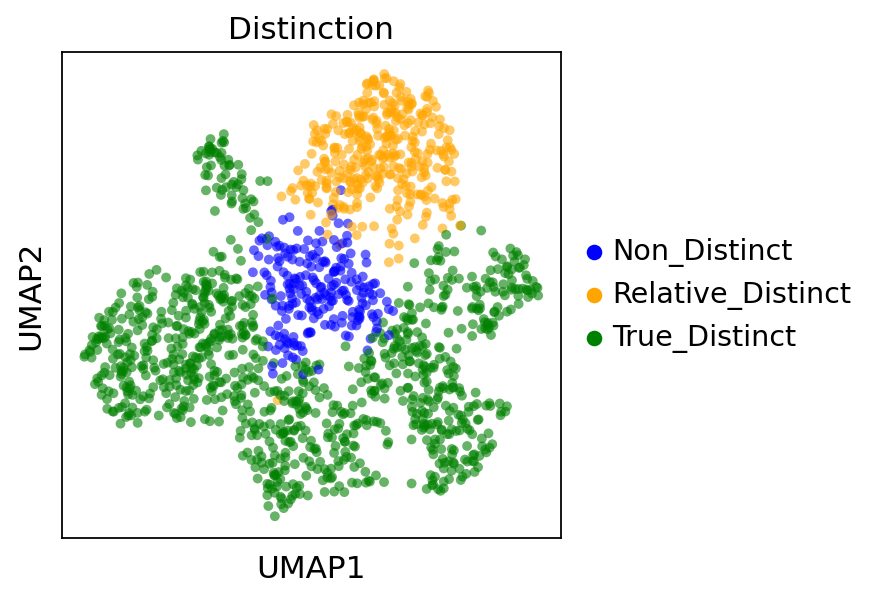

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


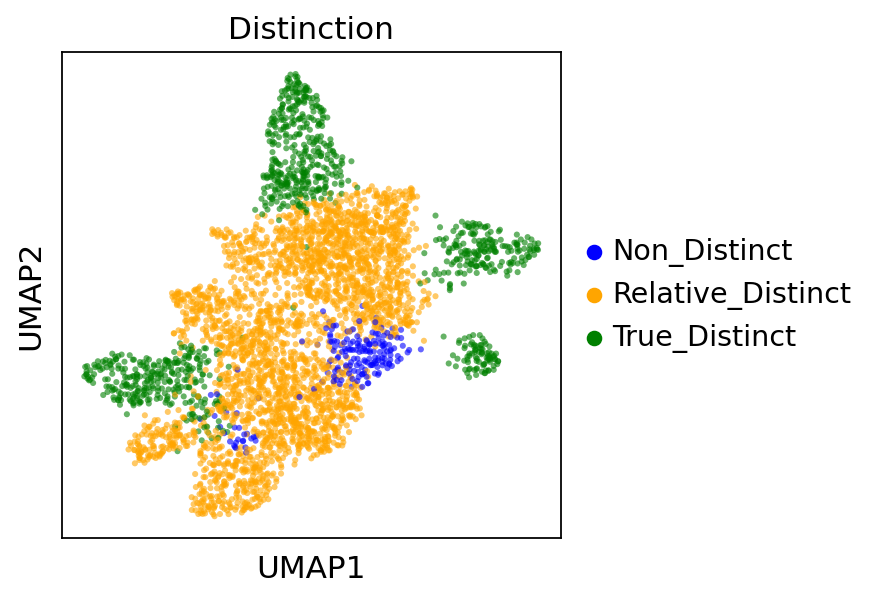

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


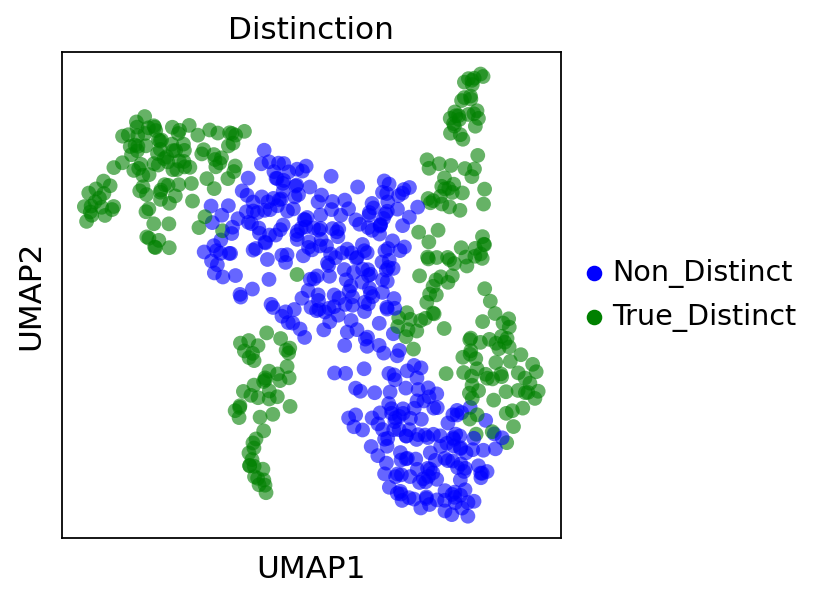

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


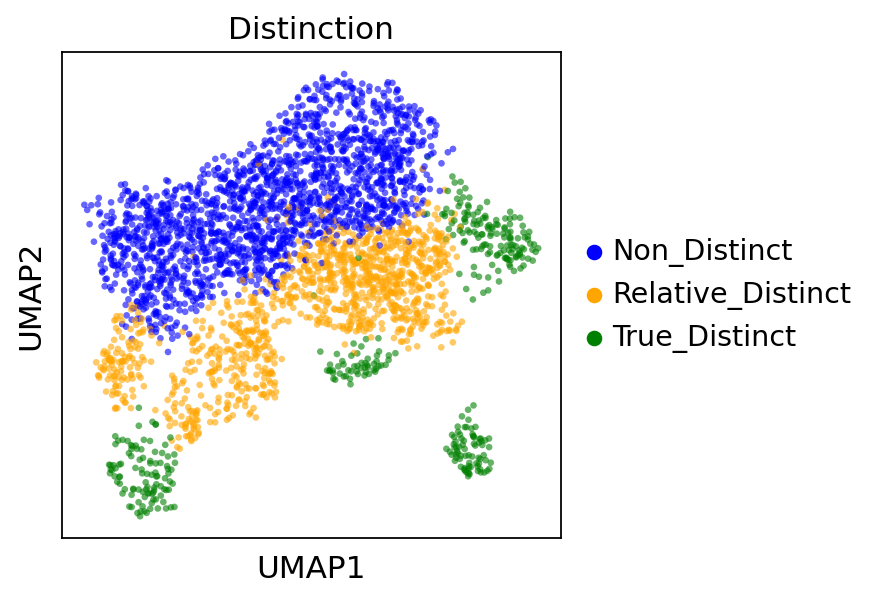

In [61]:
sc.settings.figdir = cluster_distinction_path+'/p4_6'
sc.pl.umap(p4_6_doubletfiltered_neuronal, color= "Distinction", palette={"Non_Distinct": "blue", "Relative_Distinct": "orange", "True_Distinct": "green"}, alpha = .6, save='_p4_6_distinction.png')

sc.settings.figdir = cluster_distinction_path+'/p0'
sc.pl.umap(p0_doubletfiltered_neuronal, color= "Distinction", palette={"Non_Distinct": "blue", "Relative_Distinct": "orange", "True_Distinct": "green"}, alpha = .6, save='_p0_distinction.png')

sc.settings.figdir = cluster_distinction_path+'/p10'
sc.pl.umap(p10_doubletfiltered_neuronal, color= "Distinction", palette={"Non_Distinct": "blue", "Relative_Distinct": "orange", "True_Distinct": "green"}, alpha = .6, save='_p10_distinction.png')

sc.settings.figdir = cluster_distinction_path+'/p15'
sc.pl.umap(p15_doubletfiltered_neuronal, color= "Distinction", palette={"Non_Distinct": "blue", "Relative_Distinct": "orange", "True_Distinct": "green"},alpha = .6, save='_p15_distinction.png')

# Correlated Unique Genes

- To find the closest clustural neighbor through time, the clusters are paired and all the crossover unique genes are siphoned.

- The pairs are (p0, p4/6), (p4/6, p10), and (p10, p15)

- From here said genes are ranked according to its mean expression ratio and the average of said ration between both timepoint comparisons

- After doing so the data was then post filtered by hand to remove the poorest quality genes from the dataset

- This dataset is then plotted using a dotplot organized by the clusteral pairs through time

In [62]:
correlated_unique_genes_path = testing_results_dir + 'Correlated_Unique_Genes'

if os.path.exists(correlated_unique_genes_path):
    shutil.rmtree(correlated_unique_genes_path)
os.mkdir(correlated_unique_genes_path)

In [63]:
# Beware that if not Quick_Run the correlated unique genes will be slightly variant from the saved correlated unique genes dictionary file due to post curating of the data

if not Quick_Run:
  all_timepoint_correlated_unique_genes_dict = Correlated_Unique.Correlated_Unique_Genes_Constructor(timepoint_pair_name_tuples, timepoint_pair_anndata_tuples, all_timepoint_unique_genes_dict)

In [64]:
Correlated_Unique.Correlated_Unique_Genes_Dotplot_Constructor(correlated_unique_genes_path, timepoint_pair_name_tuples, timepoint_pair_anndata_tuples, all_timepoint_correlated_unique_genes_dict)

Output hidden; open in https://colab.research.google.com to view.

# Harmony Integration

- Using the prior cluster labels assigned, the harmony clustering algorithm is used to combine the different timepoint datasets, similar to the batch filtering done for the different experimental datasets within the same timepoint in the pre-processing of the anndata

- The ascending timepoint pairs are concatenated, harmony integrated, PCA'ed,and plotted using a UMAP

In [65]:
if not Quick_Run:

  p0_p4_6_integrated = sc.concat([p0_doubletfiltered_neuronal, p4_6_doubletfiltered_neuronal], join='outer')
  p4_6_p10_integrated =  sc.concat([p4_6_doubletfiltered_neuronal, p10_doubletfiltered_neuronal], join='outer')
  p10_p15_integrated = sc.concat([p10_doubletfiltered_neuronal, p15_doubletfiltered_neuronal], join='outer')

  sc.tl.pca(p0_p4_6_integrated)
  sce.pp.harmony_integrate(p0_p4_6_integrated, 'cluster_labels')

  sc.tl.pca(p4_6_p10_integrated)
  sce.pp.harmony_integrate(p4_6_p10_integrated, 'cluster_labels')

  sc.tl.pca(p10_p15_integrated)
  sce.pp.harmony_integrate(p10_p15_integrated, 'cluster_labels')

In [66]:
if not Quick_Run:

  sc.pp.neighbors(p0_p4_6_integrated, n_neighbors=30,  n_pcs=30, method = 'umap')
  sc.tl.leiden(p0_p4_6_integrated, resolution = .5)
  sc.tl.umap(p0_p4_6_integrated)

  sc.pp.neighbors(p4_6_p10_integrated, n_neighbors=30, n_pcs=30, method = 'umap')
  sc.tl.leiden(p4_6_p10_integrated, resolution = .6)
  sc.tl.umap(p4_6_p10_integrated)


  sc.pp.neighbors(p10_p15_integrated, n_neighbors=30, n_pcs=30, method = 'umap')
  sc.tl.leiden(p10_p15_integrated, resolution = .6)
  sc.tl.umap(p10_p15_integrated)

In [67]:
if Quick_Run:

  p0_p4_6_integrated_h5ad_file = permanent_results_dir+'Harmony_Integrated/Harmony_h5ad/p0_p4_6_integrated.h5ad'
  p4_6_p10_integrated_h5ad_file = permanent_results_dir+'Harmony_Integrated/Harmony_h5ad/p4_6_p10_integrated.h5ad'
  p10_p15_integrated_h5ad_file = permanent_results_dir+'Harmony_Integrated/Harmony_h5ad/p10_p15_integrated.h5ad'

  p0_p4_6_integrated= sc.read_h5ad(p0_p4_6_integrated_h5ad_file)
  p4_6_p10_integrated = sc.read_h5ad(p4_6_p10_integrated_h5ad_file)
  p10_p15_integrated= sc.read_h5ad(p10_p15_integrated_h5ad_file)

In [68]:
harmony_integrated_dir = testing_results_dir + 'Harmony_Integrated'
if os.path.exists(harmony_integrated_dir):
  shutil.rmtree(harmony_integrated_dir)
os.mkdir(harmony_integrated_dir)

In [69]:
harmony_integrated_umap_dir = harmony_integrated_dir+'/'+'Harmony_Umap'
if os.path.exists(harmony_integrated_umap_dir):
  shutil.rmtree(harmony_integrated_umap_dir)
os.mkdir(harmony_integrated_umap_dir)

In [70]:
sc.settings.figdir = harmony_integrated_umap_dir+'/'

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


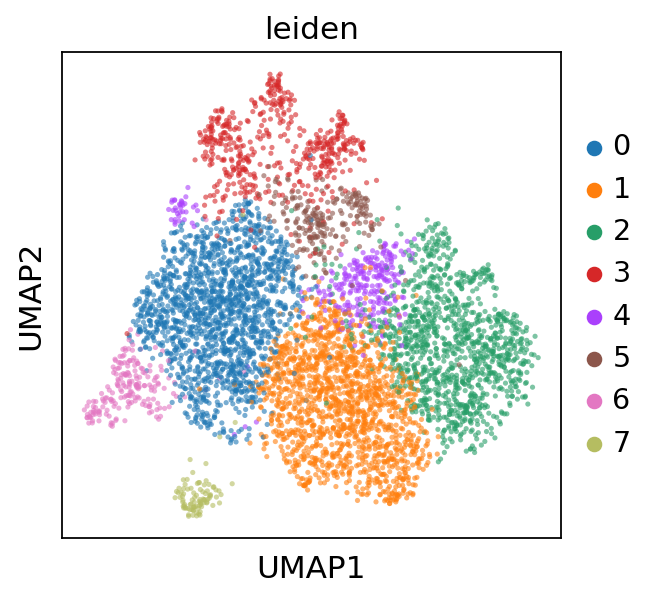

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


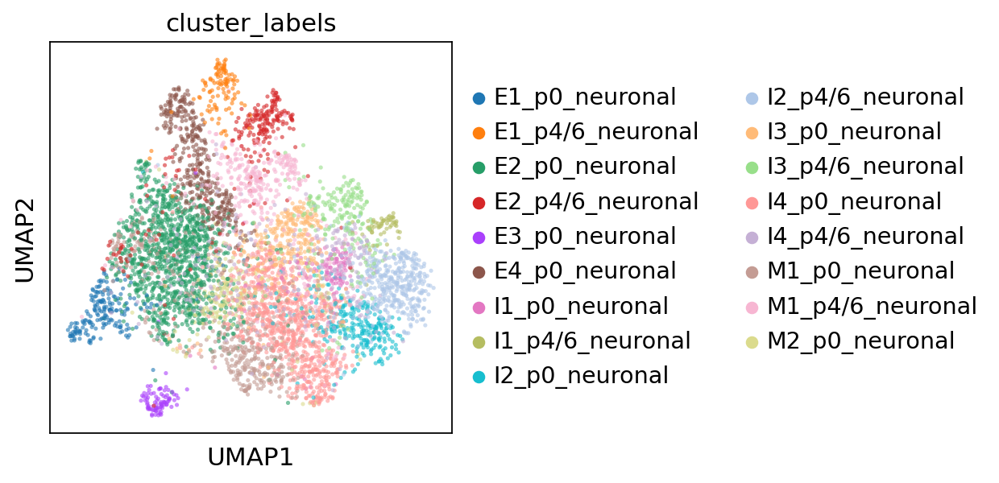

In [71]:
sc.pl.umap(p0_p4_6_integrated, color= "leiden", alpha = .6, save='_p0_p4_6_integrated_leiden.png')
sc.pl.umap(p0_p4_6_integrated, color= 'cluster_labels', alpha = .6, save='_p0_p4_6_integrated_cluster_labels.png')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


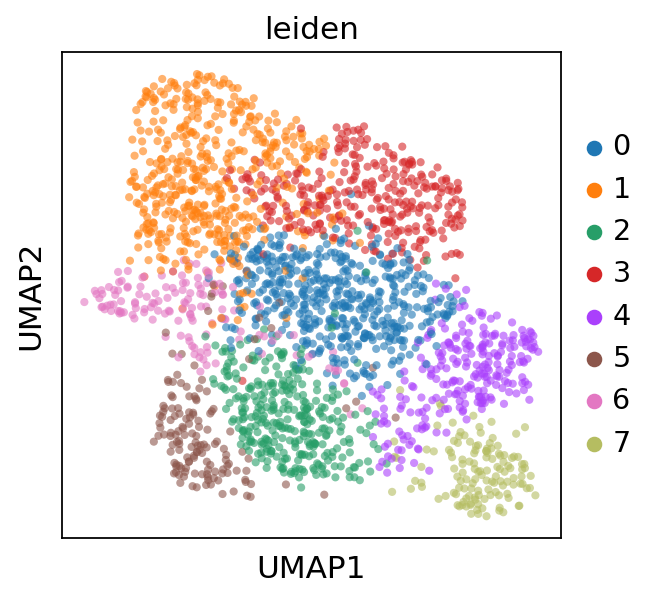

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


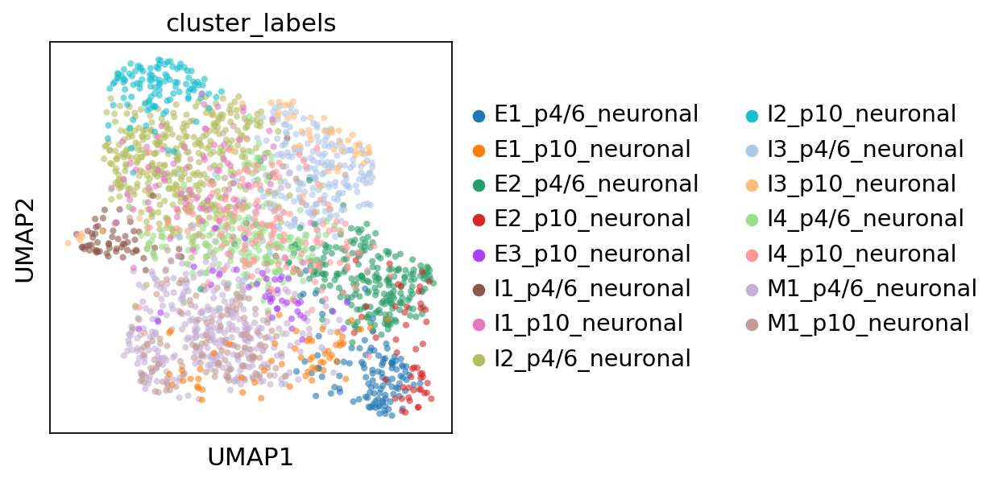

In [72]:
sc.pl.umap(p4_6_p10_integrated, color= "leiden", alpha = .6,  save='_p4_6_p10_integrated_leiden.png')
sc.pl.umap(p4_6_p10_integrated, color= 'cluster_labels', alpha = .6, save='_p4_6_p10_integrated_cluster_labels.png')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


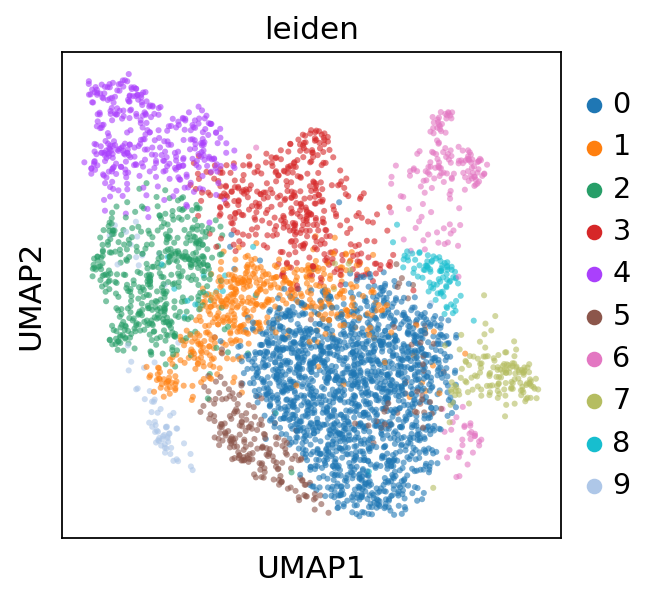

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


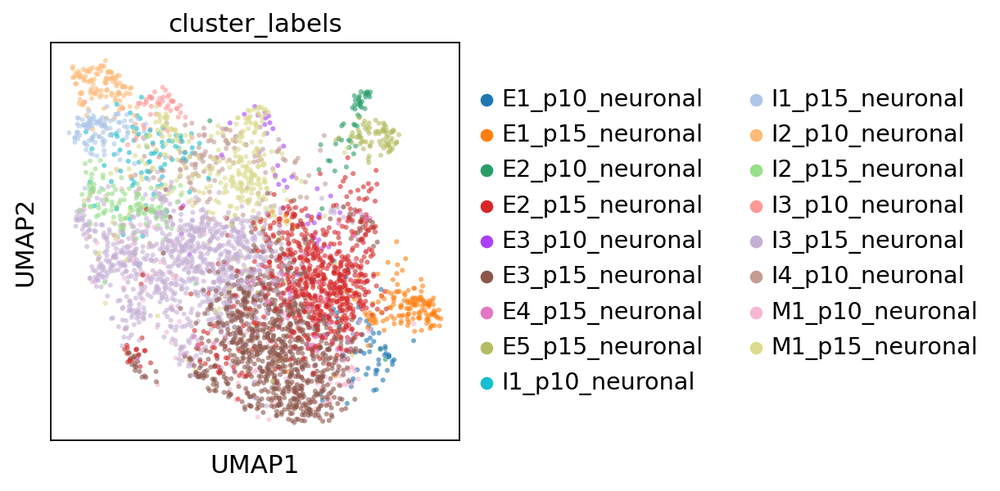

In [73]:
sc.pl.umap(p10_p15_integrated, color= "leiden", alpha = .6,  save='_p10_p15_integrated_leiden.png')
sc.pl.umap(p10_p15_integrated, color= 'cluster_labels', alpha = .6, save='_p10_p15_integrated_cluster_labels.png')

In [74]:
p0_p4_6_integrated.write_h5ad(testing_results_dir+'Harmony_H5ad/p0_p4_6_integrated.h5ad')
p4_6_p10_integrated.write_h5ad(testing_results_dir+'Harmony_H5ad/p4_6_p10_integrated.h5ad')
p10_p15_integrated.write_h5ad(testing_results_dir+'Harmony_H5ad/p10_p15_integrated.h5ad')

In [75]:
all_timepoints_integrated_list = [p0_p4_6_integrated, p4_6_p10_integrated, p10_p15_integrated]
all_timepoints_integrated_labels_list = ['p0 vs p4/6', 'p4/6 vs p10', 'p10 vs p15']
all_timepoints_integrated_percentage_correlated_dir = [harmony_integrated_dir+'/p0_p4_6_integrated_per_corr.txt', harmony_integrated_dir+'/p4_6_p10_integrated_per_corr.txt', harmony_integrated_dir+'/p10_p15_integrated_per_corr.txt']

# Harmony Correlation

- Using the integrated datasets, and the cluster_labels, each cluster from each timepoint is now compared for its nearest neibhor

- This process can be visualized as below:

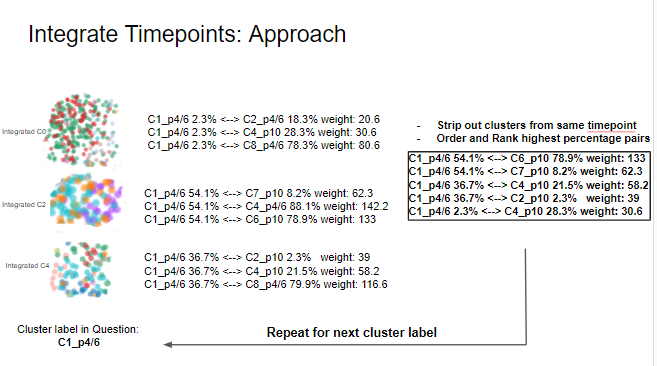



- An integrated cluster is firstly identified and the percentage of cells coming from each cluster_label (with respect to the old timepoint) within the integrated cluster is identified.

- This from here each percentage of cells of said labels is ranked and weighted with each corresponding label pair

- After doing so, these rankings are then outputted into a txt file and saved into a dictionary for further use

In [76]:
all_timepoint_relationship_tuples_dict = Harmony_Correlation.Harmony_Integrated_Correlations(all_timepoints_integrated_list, all_timepoints_integrated_labels_list, all_timepoints_integrated_percentage_correlated_dir, timepoints_anndata)

In [77]:
grey_out = 'rgba(128, 128, 128, 0.8)'


In [78]:
link_colors = ['rgba(255, 102, 102, 0.8)','rgba(51, 255, 51, 0.8)', 'rgba(255, 153, 51, 0.8)', 'rgba(255, 255, 153, 0.8)']

Inhib_Excit_Mix = [Inhibitory, Excitatory, Mix]
Inhib_Excit_Mix_rgb = ['rgba(51, 51, 255, 0.8)','rgba(255, 51, 51, 0.8)', 'rgba(153, 51, 255, 0.8)']

# Sankey Plots: Correlating Clusters through time

- The sankey plots are meant to give a visualization of the cluster correlations through time and are meant to compare the two methods of correlation: Harmony and Correlated Unique Genes

- The sankey plot functions works by assigning source and sink nodes wherein the source nodes are all the clusters with outgoing connections and the sink nodes are the clusters with incoming connections

- From here the value links assign the weight of the sankey connection defined by the weights assigned in the respective correlating method

- Using these values obtained the sankey algorithm outputs the data visually

In [79]:
all_timepoints_cluster_labels = General_Sankey.All_Timepoint_Cluster_Labels_Constructor(timepoints_anndata, timepoints_anndata_names)

In [80]:
general_type_color_labels = General_Sankey.General_Type_Color_Labels_Constructor(all_timepoints_cluster_labels, Inhib_Excit_Mix, Inhib_Excit_Mix_rgb)

In [81]:
harmony_all_link_value_based_colors, harmony_source_nodes, harmony_sink_nodes, harmony_value_links = Harmony_Sankey.Harmony_Sankey_Constructor(all_timepoint_relationship_tuples_dict, timepoint_pair_name_tuples, link_colors, all_timepoints_cluster_labels)

In [82]:
unique_genes_all_link_value_based_colors, unique_genes_source_nodes, unique_genes_sink_nodes, unique_genes_value_links, all_timepoint_corr_uniq_genes_tuple_pairs = Correlated_Unique_Sankey.Correlated_Unique_Sankey_Constructor(all_timepoints_cluster_labels, all_timepoint_correlated_unique_genes_dict, link_colors)

In [83]:
all_link_value_based_colors_non_unique_correlations = Correlated_Unique_Sankey.Grey_Out_Non_Unique_Correlations(grey_out, harmony_source_nodes, harmony_all_link_value_based_colors, all_timepoints_cluster_labels, harmony_sink_nodes, all_timepoint_corr_uniq_genes_tuple_pairs)

# Harmony Integrated Clusters Sankey Plot

- Give purely the sankey correlations as respresented by the percentage correlations determined by the harmony integrated clustering

- The green connections are the strongest with harmony correlation rangeing from 70-100%

- The Orange connections are the moderate correlations rangeing from 40-70%

- The Red connections are the mild correlations rangeing from 20-40%

- The Yellow connections are the weak correlations rangeing from 0-20%



In [84]:
sankey_dir = testing_results_dir+ 'Sankey_Diagrams'
if os.path.exists(sankey_dir):
  shutil.rmtree(sankey_dir)
os.mkdir(sankey_dir)

In [85]:
# Harmony Timepoint Integrated Clusters #
fig = go.Figure(data=[go.Sankey(
    valueformat='.3r',
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = .5),
      label = all_timepoints_cluster_labels,
      color = general_type_color_labels
    ),
    link = dict(
      source = harmony_source_nodes,
      target = harmony_sink_nodes,
      value = harmony_value_links,
      color = harmony_all_link_value_based_colors
  ))])

fig.update_layout(title_text="Harmony Timepoint Integrated Clusters", font_size=16)
fig.show()
fig.write_image(sankey_dir+'/Harmony_Sankey.png', width = 1500, height= 500, engine = "kaleido")

# Correlated Uniqe Genes Sankey Plot

- Gives purely the sankey correlations as represented by the number of unique genes correlated between two timepoint clusters

- The green connections are the strongest with correlation of greater than 25 unique genes

- The Orange connections are the moderate correlations of greater than 15 but below 25 unique genes

- The Red connections are the mild correlations of greater than 5 and below 15 unique genes

- The Yellow connections are the weak correlations of greater than 1 and below 5 unique gene



In [86]:
# Sankey Correlated Unique Genes #
fig = go.Figure(data=[go.Sankey(
    valueformat='.3r',
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = .5),
      label = all_timepoints_cluster_labels,
      color = general_type_color_labels
    ),
    link = dict(

      source = unique_genes_source_nodes,
      target = unique_genes_sink_nodes,
      value = unique_genes_value_links,
      color = unique_genes_all_link_value_based_colors
  ))])

fig.update_layout(title_text=" Correlated Unique Genes ", font_size=16)
fig.show()
fig.write_image(sankey_dir+'/Corr_Unique_Genes_Sankey.png', width = 1500, height= 500, engine = "kaleido")

# Harmony vs Correlated Unique Genes Sankey Plot

- This is a versus plot of the harmony correlation sankey and the correlated unique genes sankey wherein the connections not present in the correlated unqiue genes and harmony are greyed out and the the colored connections are the ones present within harmony.

- All other colors are defined by the percentages in the original harmony sankey correlation plot


In [87]:
# Harmony Timepoint Integrated Clusters vs. Correlated Unique Genes #
fig = go.Figure(data=[go.Sankey(
    valueformat='.3r',
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = .5),
      label = all_timepoints_cluster_labels,
      color = general_type_color_labels
    ),
    link = dict(

      source = harmony_source_nodes,
      target = harmony_sink_nodes,
      value = harmony_value_links,
      color = all_link_value_based_colors_non_unique_correlations
  ))])


fig.update_layout(title_text="Harmony Timepoint Integrated Clusters vs. Correlated Unique Genes", font_size=16)
fig.show()
fig.write_image(sankey_dir+'/Harmony_vs_Corr_Unique_Genes_Sankey.png', width = 1500, height= 500, engine = "kaleido")

# Superior Colliculus Layer to Cluster Correlation Analysis and Hypothesis Testing

- Through the use of the Alan Brain API and the Unique, Standard Deviation, and differentially expressed genes, all brain images regarding a given gene and their expression within a particular layer were identified.

- In order to test the hypothesis that certain clusters are expressing genes that are more regionally specific to a particular layer of the superior colliculus, a T-test was performed to assign P-vals and reject or fail to reject the null hypothesis

The Null is as follows:

- *The mean expression ratio for genes expressed within all layers of the SC for a given cluster is no different than the mean expression ration for genes expressed within a specific layer of the Superior colliculus for said cluster* **bold text**






In other words, a clusters expression for genes that are regionally non-specific within the Superior Colliculus will be the same as said clusters expression levbel of genes specific to a region within the Superior Colliculus

- To be able to test the null, a 100 highly differentially expressed genes within all individual neuronal clusters were curated based on equal expressional distribution within the superior colliculus BUT NOT on equal distribution of expression within the clusters

- From here the expressional distribution within the clusters themselves were determined allowing for the null distribution to be set.

- The expressional distribution was determined by the percentage of cells expressing a given gene, and how strongly a cluster expressed said gene.

The formula is as follows for each individual cluster:

sum(avgerage_expression*expression_percentage)/(Number of genes)


- Given the distribution of mean expression ratios of genes that were non-specific to any particular region of the Superior colliculs, the distribution of clusteral expression of genes that WERE regionally specific was also determined

- From here a t-test was performed to determine the P-Value of how likely a given clusters mean expressional distribution with regards to its regionally specific genes was different from the mean expressional distribution of genes non-specific to the Superior colliculus layers.

- Thereafter, the corresponding P-Values and the expressional distribution was plotted as a bar graph

In [88]:
# all_layer_dict holds all the genes non specific to the Superior colliculus layers
# all_sup_int_deep_dict holds all the genes specific to the Superior colliculus layers (Superficial, Intermediate, and Deep)
# all_sup_int_deep_comb_dict holds all the genes specific to the Superior colliculus layers but with Deep and Intermediate combined into one (Superficial and Intermediate-Deep)

all_layer_dict = {'p0': {'All Layer': ['Aatk', 'Adcy1', 'Ahi1', 'Apba2', 'Apc', 'Apc2', 'Arnt2', 'Astn1', 'Atp1a1', 'Bmpr2', 'Cadm3', 'Camta1', 'Camta2', 'Casp3', 'Cd47', 'Cdc42', 'Cdk5', 'Chl1', 'Clstn1', 'Cntn1', 'Csnk1a1', 'Csnk1e', 'Cst3', 'Ctnnb1', 'Cxxc4', 'Daam1', 'Dcx', 'Deaf1', 'Dpysl5', 'Drap1', 'Drg1', 'Dtx1', 'Efna2', 'Efna3', 'Enah', 'Ephb2', 'Fxyd6', 'Fyn', 'Gabbr1', 'Gabbr2', 'Gls', 'Glul', 'Gria4', 'Grin2b', 'Grm5', 'Gsk3b', 'Gtf2h5', 'Hdac6', 'Hmgn3', 'Kif5c', 'L1cam', 'Lmtk3', 'Lztr1', 'Mdh2', 'Mgat5b', 'Mgst3', 'Mycbp2', 'Myt1l', 'Ncam1', 'Necab2', 'Nfe2l1', 'Nrxn1', 'Nsd1', 'Ntrk3', 'Pafah1b1', 'Pak1', 'Pbrm1', 'Pbx2', 'Pcdh10', 'Pde10a', 'Phb2', 'Pik3r1', 'Pnn', 'Polr2m', 'Prkaca', 'Pten', 'Rab3a', 'Rac3', 'Rcor2', 'Rnf14', 'Sema4d', 'Sema6d', 'Sgk1', 'Smad2', 'Snf8', 'Sp5', 'Srpk2', 'Ssrp1', 'Stx1a', 'Syn1', 'Tcf20', 'Tcf25', 'Tox', 'Tsc22d1', 'Xbp1']}, 'p4_6': {'All Layer': ['Adcyap1r1', 'Ahi1', 'Ank3', 'C1ql2', 'Cacna1a', 'Cacna1b', 'Camk4', 'Camta1', 'Cdc42', 'Cers4', 'Chrm3', 'Cit', 'Cntn1', 'Cxxc4', 'Dscaml1', 'Ebf2', 'Efnb3', 'En1', 'Epha5', 'Ephb1', 'Fos', 'Fxyd6', 'Gabra4', 'Gabrb1', 'Grik2', 'Grin2b', 'Gtf2h5', 'Hmgb1', 'Hmgn2', 'Hnrnpab', 'Jund', 'Kit', 'Klf7', 'Lhx1', 'Lrp8', 'Ly6h', 'Mgst3', 'Ncam1', 'Nrxn1', 'Ntrk3', 'Pclo', 'Pdgfa', 'Pik3cb', 'Pou3f1', 'Ppp3ca', 'Ptprz1', 'Rab3a', 'Rab3b', 'Rac3', 'Rapgef5', 'Rheb', 'Rps4x', 'Runx1t1', 'Rybp', 'Scn1a', 'Shox2', 'Syn1', 'Tcf20', 'Thra', 'Tle4', 'Trib2', 'Tshz2', 'Ube3a', 'Uncx', 'Zeb1', 'Zfp207']}, 'p15': {'All Layer': ['Abca2', 'Actb', 'Alcam', 'Apba2', 'Aplp1', 'App', 'Atp1a1', 'Atp8a1', 'B3galt2', 'Bcl11a', 'Bmpr2', 'Bmyc', 'Btf3', 'Cacna1a', 'Cacna1b', 'Camk4', 'Casp3', 'Cdc42', 'Chrm3', 'Churc1', 'Cit', 'Cited2', 'Col16a1', 'Comt', 'Cops5', 'Csnk2a1', 'Csnk2b', 'Ctnnbip1', 'Cttnbp2', 'Cxxc4', 'Cyc1', 'Dcaf7', 'Dst', 'Epha5', 'Evl', 'Fbxw7', 'Foxn3', 'Fyn', 'Gabra2', 'Gabra5', 'Gabrb1', 'Gabrb3', 'Gabrg2', 'Gatad1', 'Gnb4', 'Gpx1', 'Gria3', 'Grin1', 'Grin2b', 'Grm5', 'Hif1a', 'Hmgn1', 'Hmgn3', 'Hnrnpab', 'Hopx', 'Hspd1', 'Htr2c', 'Ikzf5', 'Jund', 'Kcnb2', 'Kcnq3', 'Kctd12', 'Kif5c', 'Lhx2', 'Ly6h', 'Mgat5b', 'Mycbp2', 'Ncam1', 'Ncam2', 'Ndnf', 'Nrxn1', 'Ntrk3', 'Pak1', 'Pbrm1', 'Pbx1', 'Pclo', 'Polr1d', 'Polr2m', 'Pou3f1', 'Ppargc1a', 'Prlr', 'Psenen', 'Ptprz1', 'Qdpr', 'Rac3', 'Rapgef5', 'Rheb', 'Rhoa', 'Rnf14', 'Rock2', 'Rps12', 'Rps4x', 'Runx1t1', 'Rybp', 'Scn1a', 'Slitrk1', 'Snf8', 'Sox11', 'Sox4', 'Sox6', 'Srpk2', 'Tcf25', 'Tenm3', 'Thra', 'Tle4', 'Top1', 'Trib2', 'Tsc22d1', 'Ube3a']}}
all_sup_int_deep_dict = {'p0': {'Intermediate': ['Bcl11b', 'Calb2', 'Cdh11', 'Cdh6', 'Cdh7', 'Cdh8', 'Ebf1', 'Emx2', 'Etv1', 'Foxb1', 'Foxp2','Gjd2', 'Gad1', 'Grm1','Id2', 'Kcnj6', 'Lypd1', 'Mafb', 'Pcdh11x', 'Rgs4','Tac1', 'Tfap2b', 'Vat1l'], 'Superficial': ['Dab1', 'Dmbx1','Grm3', 'Kitl', 'Lmo1', 'Lmo4', 'Nrgn', 'Otx2', 'Pdzd2', 'Rorb', 'Rprm', 'Sox14'], 'Deep': ['Adcyap1', 'Barhl1','Car10', 'Chrna4', 'Foxp4', 'Hes1', 'Igfbp5', 'Lypd1', 'Meis2', 'Npas3', 'Ntng1','Pcdh11x', 'Pcdh18', 'Reln','Scg2', 'Sncg', 'Tcf7l2']}, 'p4_6': {'Intermediate': ['Bcl11b', 'Cd24a', 'Foxb1', 'Gpc3', 'Hcn1', 'Lmo3', 'Meis2', 'Pcdh10', 'Pex5l', 'Slc17a6', 'Slc1a1', 'Sorl1', 'Sst', 'Tfap2b'], 'Superficial': ['Atp8a1', 'Barhl1', 'Cdh7', 'Dab1', 'Gad1', 'Gfra1','Hhip', 'Kitl', 'Lmo1', 'Lmo4', 'Nnat', 'Nrgn', 'Otx2', 'Pax7', 'Pcdh20', 'Pdzd2', 'Pnoc', 'Rorb'], 'Deep': ['Calb2', 'Car10', 'Cbln2', 'Cdh8', 'Ebf3', 'Lypd1', 'Pcdh10', 'Pcdh18', 'Tac1', 'Tcf7l2']}, 'p15': {'Intermediate': ['Adcy2', 'Bcl11b', 'Camk2a', 'Cbln2', 'Epha4', 'Gda', 'Glra3', 'Hcn1', 'Kcnc2', 'Kcnj6', 'Lmo3','Meis2','Rgs4', 'Rora', 'Sema3e', 'Slc1a1', 'Sorl1', 'Sst', 'Tfap2b', 'Tpd52l1', 'Trpc5'], 'Superficial': ['Barhl1', 'C1ql2', 'Calb1', 'Cdh7', 'Fibcd1', 'Gfra1', 'Hap1', 'Kitl', 'Lmo1', 'Lmo4', 'Otx2', 'Pnoc', 'Reln', 'Rorb', 'Rprm', 'Sox14','Tac1'], 'Deep': ['Adcyap1', 'Cartpt', 'Cd24a', 'Gpc3', 'Pex5l', 'Pou4f1']}}
all_sup_int_deep_comb_dict = {'p0': {'Intermediate-Deep': ['Adcyap1', 'Barhl1','Car10', 'Chrna4', 'Foxp4', 'Foxp2', 'Gad1', 'Grm1','Hes1', 'Igfbp5', 'Lypd1', 'Meis2', 'Ntng1','Npas3', 'Pcdh11x', 'Pcdh18', 'Rgs4','Scg2', 'Sncg', 'Tcf7l2', 'Bcl11b', 'Calb2', 'Cdh11', 'Cdh6', 'Cdh7', 'Cdh8', 'Ebf1', 'Emx2', 'Etv1', 'Foxb1', 'Gjd2', 'Id2', 'Kcnj6', 'Lypd1', 'Mafb', 'Pcdh11x', 'Reln','Tac1', 'Tfap2b', 'Vat1l'], 'Superficial': ['Dab1', 'Dmbx1','Grm3', 'Kitl', 'Lmo1', 'Lmo4', 'Nrgn', 'Otx2', 'Pdzd2', 'Rorb', 'Rprm', 'Sox14']}, 'p4_6': {'Intermediate-Deep': ['Calb2', 'Car10', 'Cbln2', 'Cdh8', 'Ebf3', 'Lypd1', 'Pcdh10', 'Pcdh18', 'Tac1', 'Tcf7l2', 'Bcl11b', 'Cd24a', 'Foxb1', 'Gpc3', 'Hcn1', 'Lmo3', 'Meis2', 'Pcdh10', 'Pex5l', 'Slc17a6', 'Slc1a1', 'Sorl1', 'Sst', 'Tfap2b'], 'Superficial': ['Atp8a1', 'Barhl1', 'Cdh7', 'Dab1', 'Gad1', 'Gfra1', 'Hhip', 'Kitl', 'Lmo1', 'Lmo4', 'Nnat', 'Nrgn', 'Otx2', 'Pax7', 'Pcdh20', 'Pdzd2', 'Pnoc', 'Rorb']}, 'p15': {'Intermediate-Deep': ['Adcyap1', 'Cartpt', 'Cd24a', 'Gpc3', 'Pex5l', 'Pou4f1', 'Adcy2', 'Bcl11b', 'Camk2a', 'Cbln2', 'Epha4', 'Gda', 'Glra3', 'Hcn1', 'Kcnc2', 'Kcnj6', 'Lmo3', 'Meis2', 'Rgs4', 'Rora', 'Sema3e', 'Slc1a1', 'Sorl1', 'Sst', 'Tfap2b', 'Tpd52l1', 'Trpc5'], 'Superficial': ['Barhl1', 'C1ql2', 'Calb1', 'Cdh7', 'Fibcd1', 'Gfra1', 'Hap1', 'Kitl', 'Lmo1', 'Lmo4', 'Otx2', 'Pnoc', 'Reln', 'Rorb', 'Rprm', 'Sox14','Tac1']}}

In [89]:
p0_p4_6_p15_annadata = [p0_doubletfiltered_neuronal, p4_6_doubletfiltered_neuronal, p15_doubletfiltered_neuronal]
p0_p4_6_p15_anndata_names = ['p0','p4_6','p15']

In [90]:
p0_p4_6_p15_layer_non_specific_exp_mean_dict, p0_p4_6_p15_layer_non_specific_exp_standard_deviation_dict = Layer_Cluster_Relation.Layer_Cluster_Gene_Exp_Dict_Constructor(all_layer_dict, p0_p4_6_p15_annadata, p0_p4_6_p15_anndata_names)

p0_p4_6_p15_layer_specific_exp_mean_dict, p0_p4_6_p15_layer_specific_exp_standard_deviation_dict = Layer_Cluster_Relation.Layer_Cluster_Gene_Exp_Dict_Constructor(all_sup_int_deep_dict, p0_p4_6_p15_annadata, p0_p4_6_p15_anndata_names)

p0_p4_6_p15_layer_specific_exp_comb_mean_dict, p0_p4_6_p15_layer_specific_exp_comb_standard_deviation_dict = Layer_Cluster_Relation.Layer_Cluster_Gene_Exp_Dict_Constructor(all_sup_int_deep_comb_dict, p0_p4_6_p15_annadata, p0_p4_6_p15_anndata_names)

In [91]:
p0_p4_6_p15_layer_specific_exp_p_value_dict = Layer_Cluster_Relation.Layer_Specificity_Gene_Expressional_Significance_T_Test(p0_p4_6_p15_layer_specific_exp_standard_deviation_dict, p0_p4_6_p15_layer_specific_exp_mean_dict, p0_p4_6_p15_layer_non_specific_exp_mean_dict)

p0_p4_6_p15_layer_specific_exp_comb_p_value_dict = Layer_Cluster_Relation.Layer_Specificity_Gene_Expressional_Significance_T_Test(p0_p4_6_p15_layer_specific_exp_comb_standard_deviation_dict, p0_p4_6_p15_layer_specific_exp_comb_mean_dict, p0_p4_6_p15_layer_non_specific_exp_mean_dict)

In [92]:
layer_expression_correlation = testing_results_dir + 'Layer_Expression_Correlation'

if os.path.exists(layer_expression_correlation):
  shutil.rmtree(layer_expression_correlation)
os.mkdir(layer_expression_correlation)

In [93]:
non_specific_layer_expression_correlation_dir = layer_expression_correlation+'/'+'All_Layer_Distribution'

if os.path.exists(non_specific_layer_expression_correlation_dir):
  shutil.rmtree(non_specific_layer_expression_correlation_dir)
os.mkdir(non_specific_layer_expression_correlation_dir)

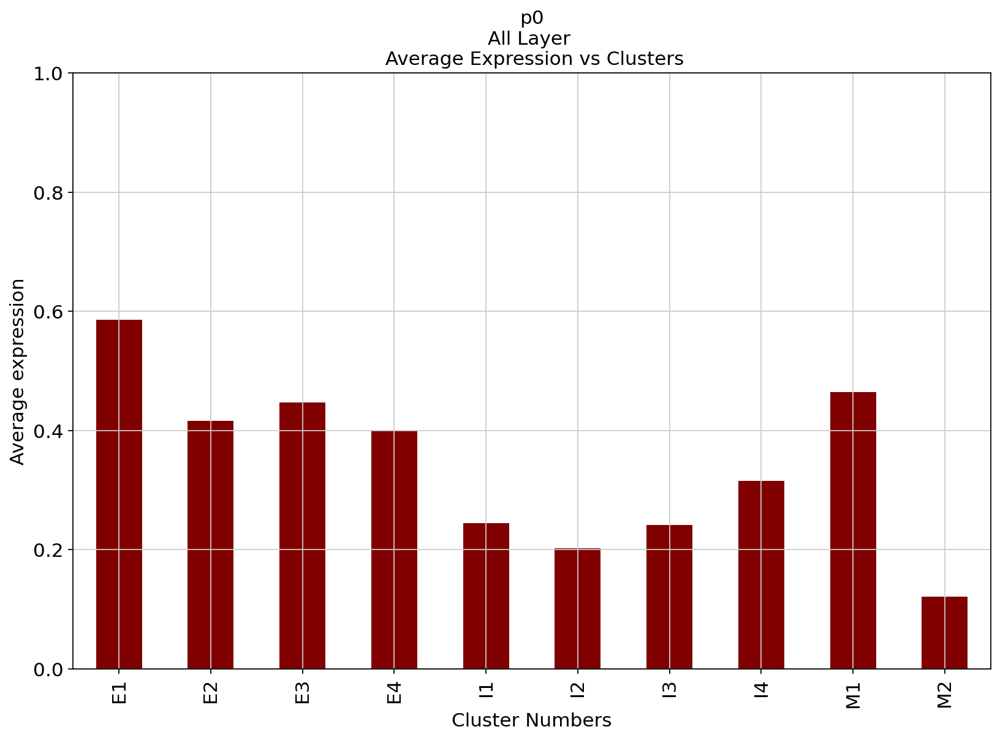

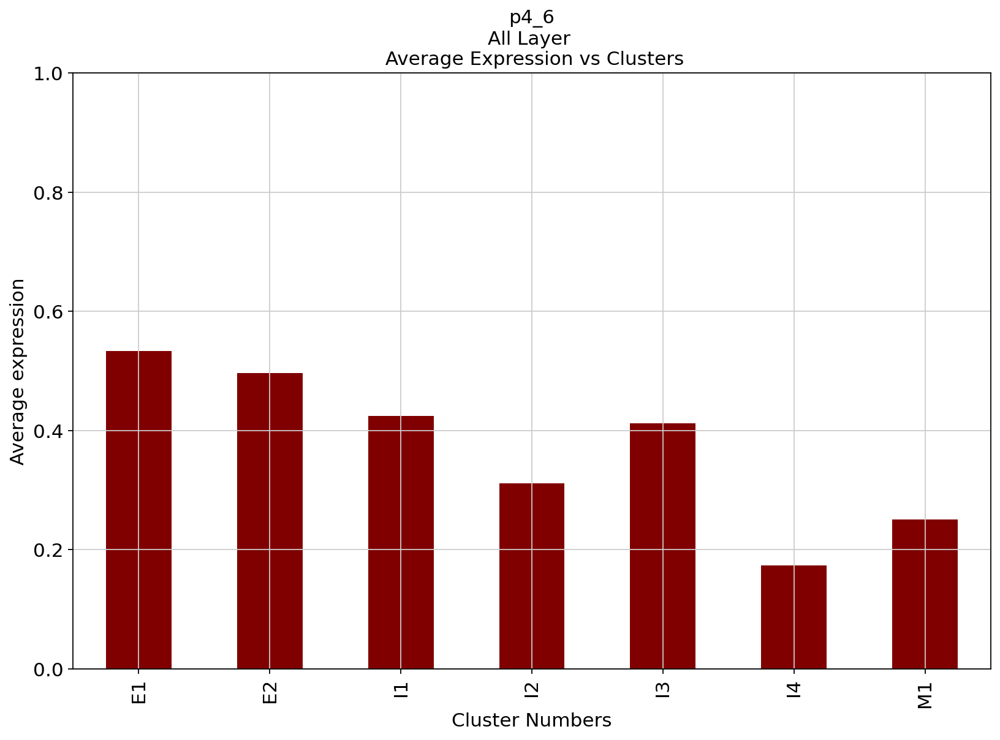

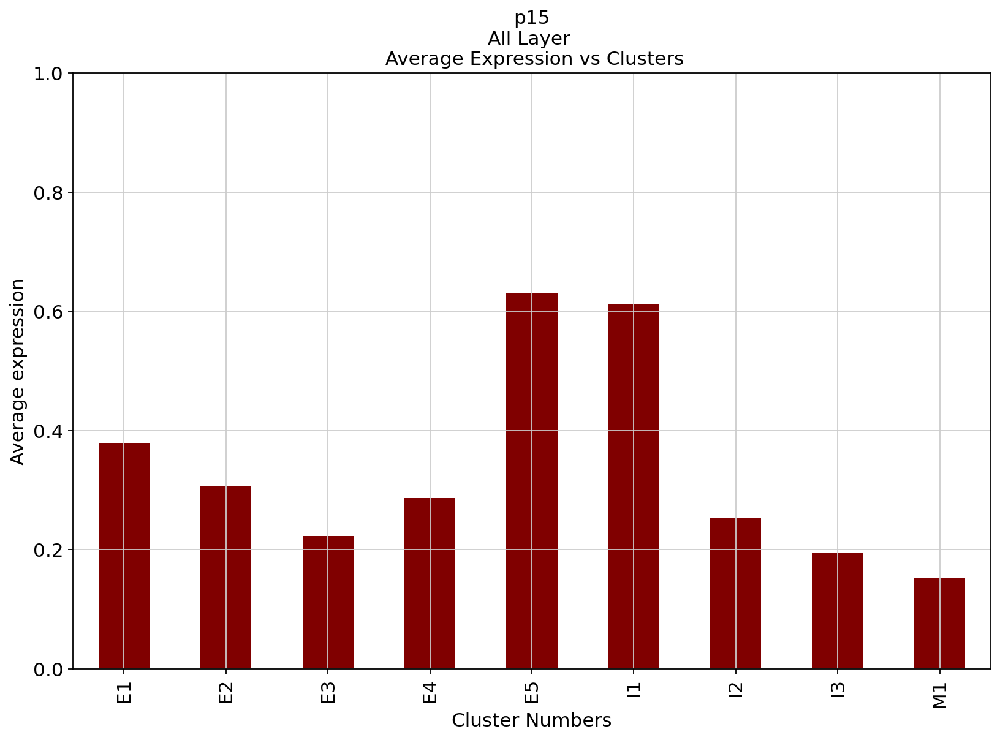

In [94]:
p_value_bool = False
Layer_Cluster_Relation.Plot_Layer_Expression_Distribution(p0_p4_6_p15_layer_non_specific_exp_mean_dict, p_value_bool, p0_p4_6_p15_layer_specific_exp_p_value_dict, non_specific_layer_expression_correlation_dir)

In [95]:
layer_specific_expression_correlation_dir = layer_expression_correlation+'/'+'Superficial_Intermediate_Deep'

if os.path.exists(layer_specific_expression_correlation_dir):
  shutil.rmtree(layer_specific_expression_correlation_dir)
os.mkdir(layer_specific_expression_correlation_dir)

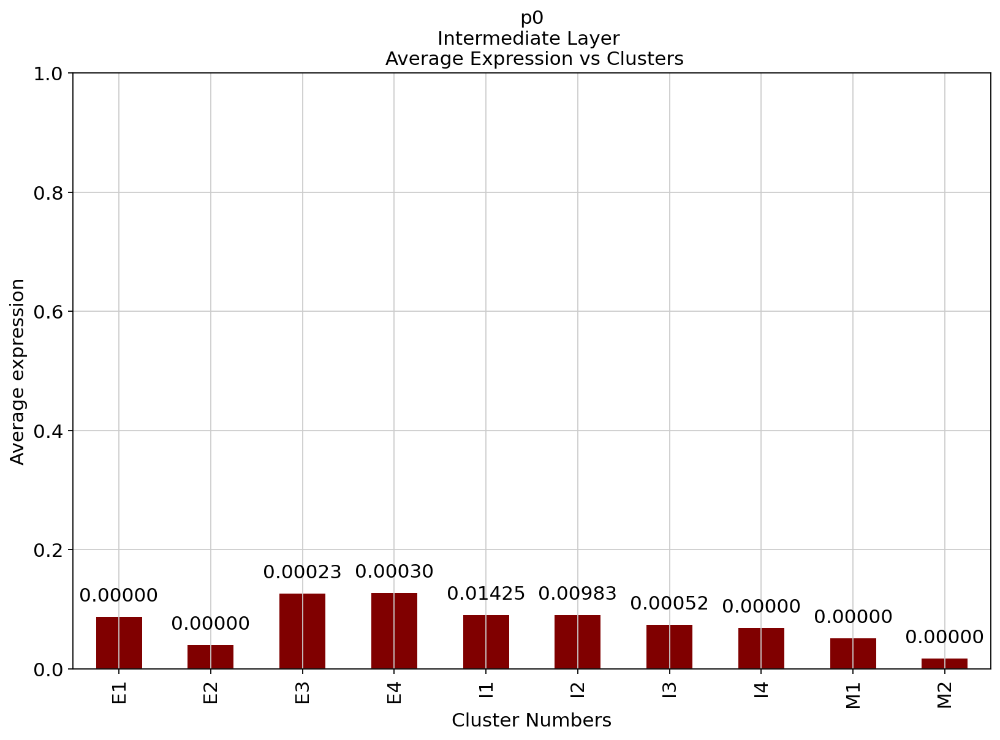

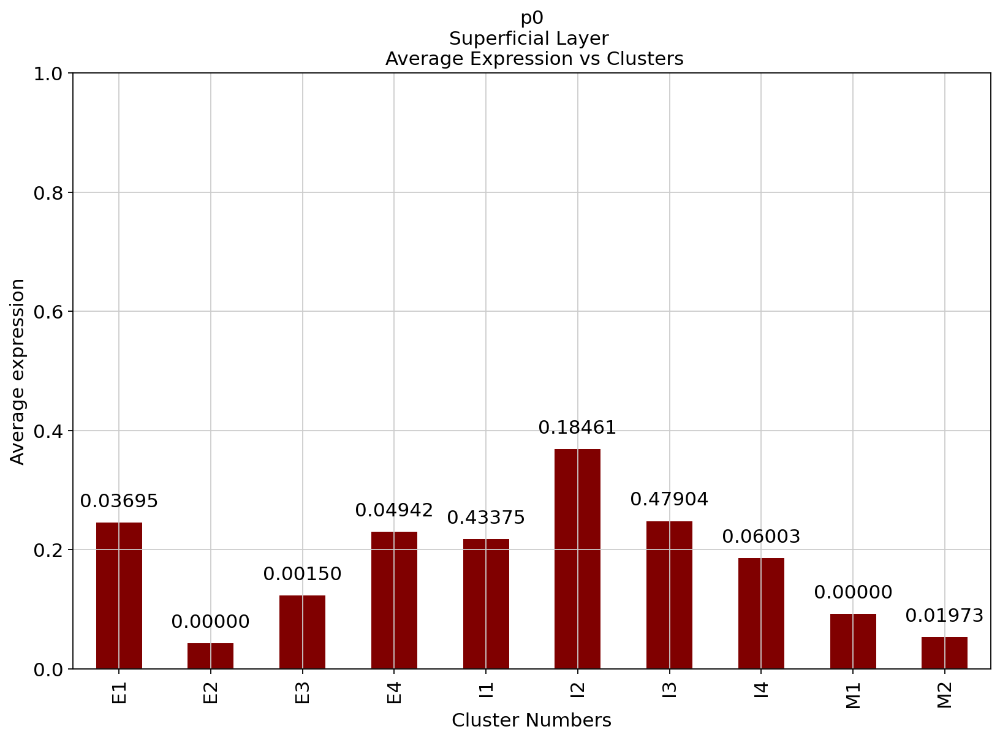

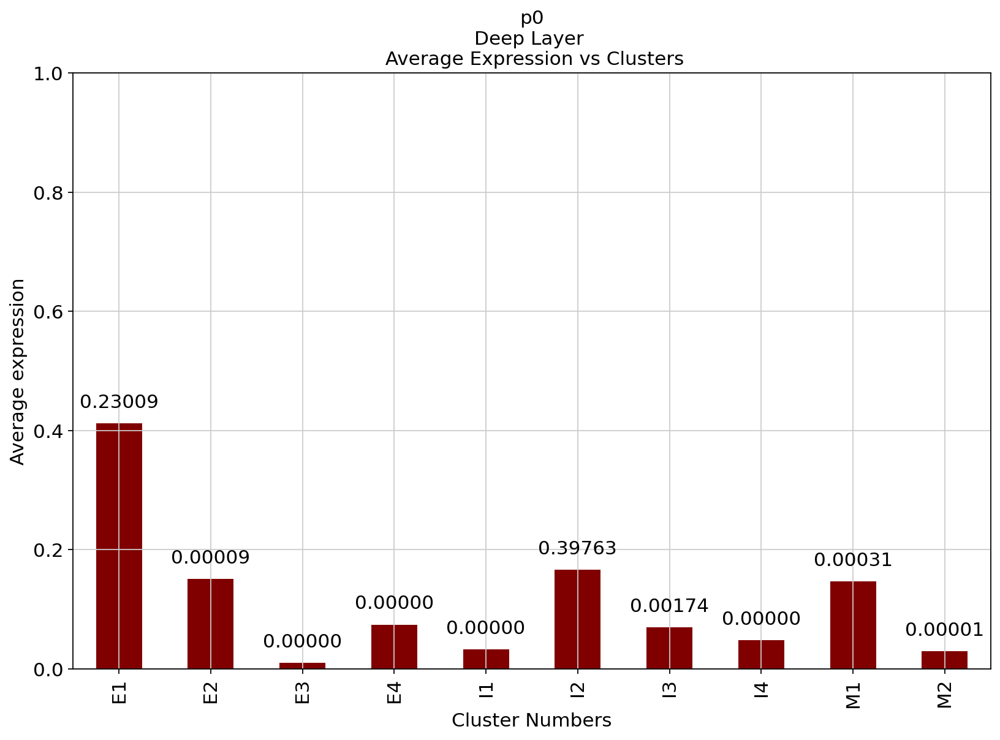

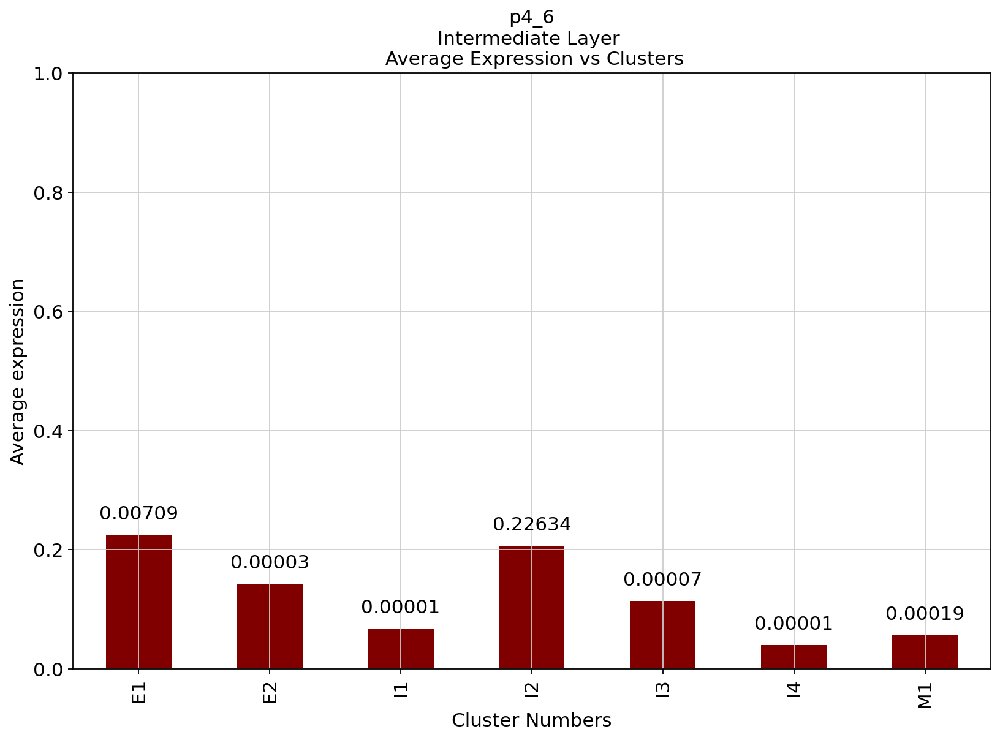

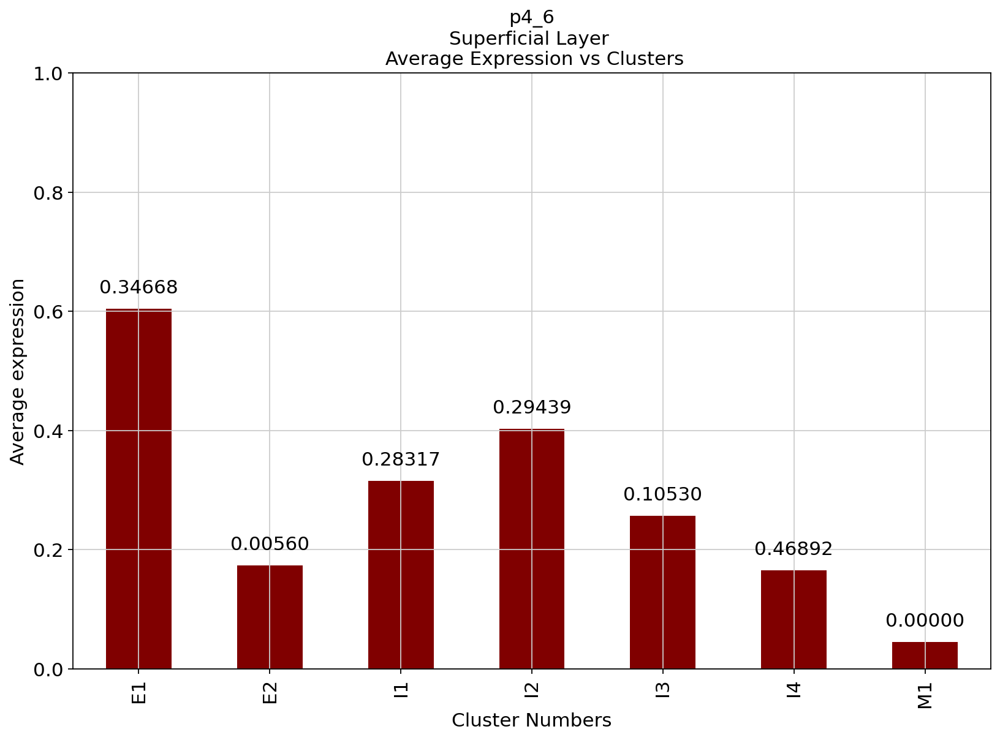

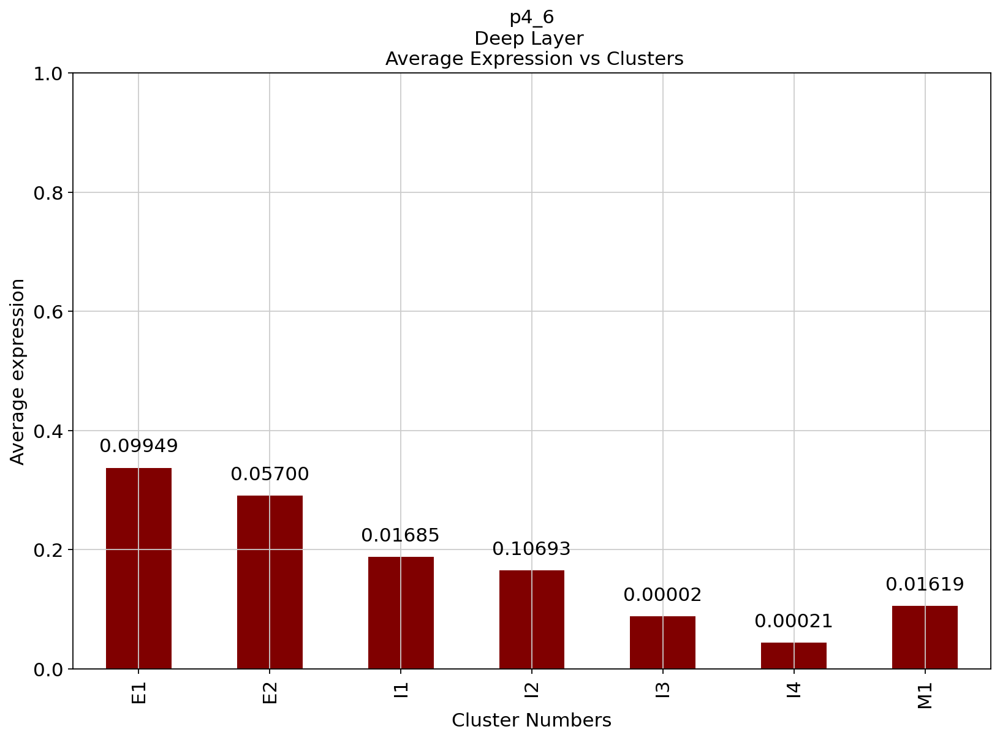

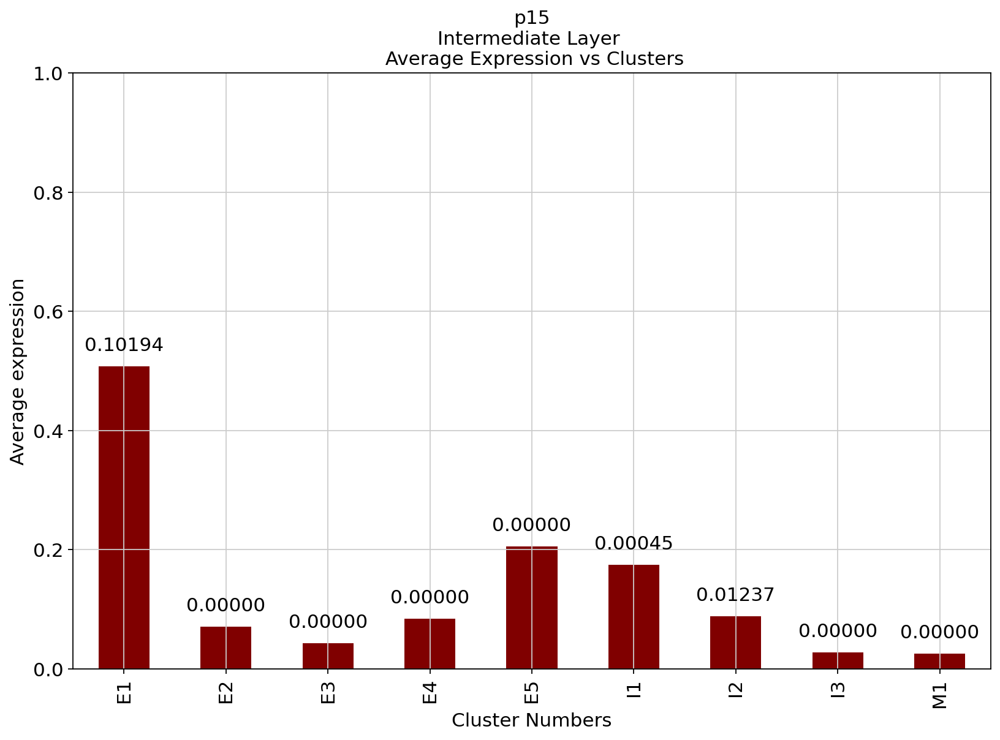

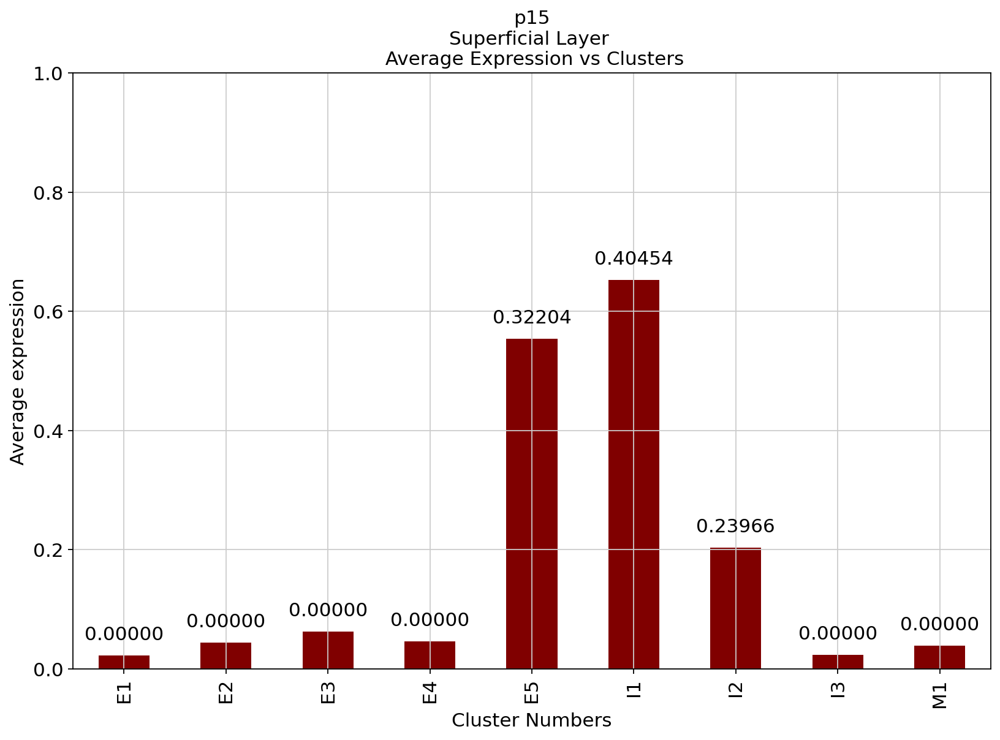

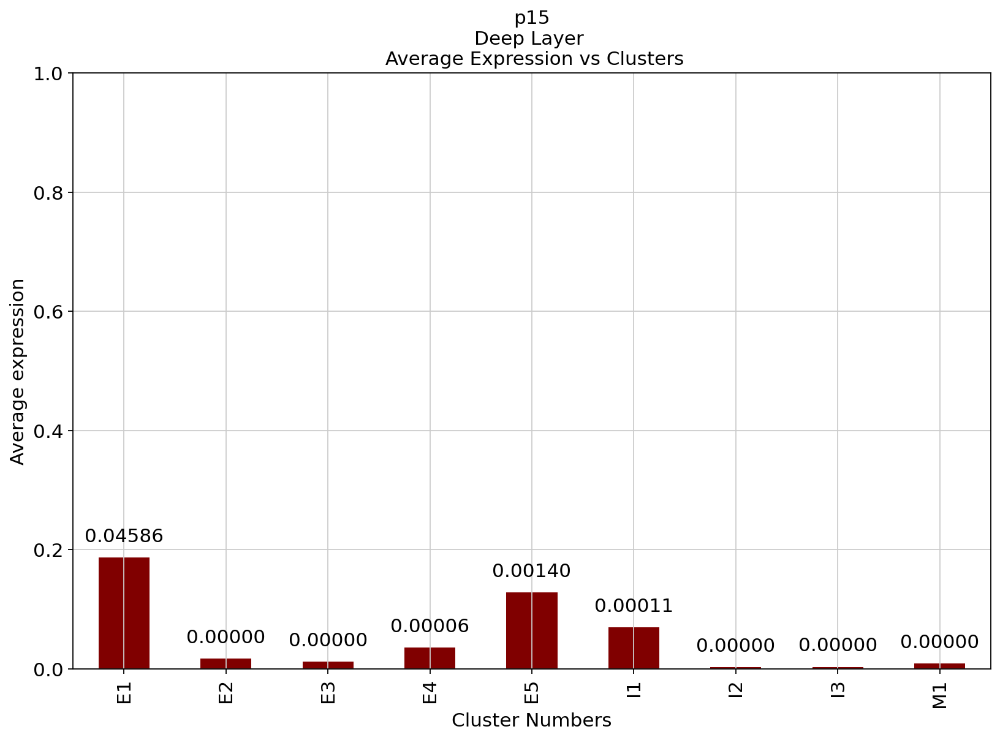

In [96]:
p_value_bool = True
Layer_Cluster_Relation.Plot_Layer_Expression_Distribution(p0_p4_6_p15_layer_specific_exp_mean_dict, p_value_bool, p0_p4_6_p15_layer_specific_exp_p_value_dict, layer_specific_expression_correlation_dir)

In [97]:
layer_specific_comb_expression_correlation_dir = layer_expression_correlation+'/'+'Superficial_Intermediate-Deep'

if os.path.exists(layer_specific_comb_expression_correlation_dir):
  shutil.rmtree(layer_specific_comb_expression_correlation_dir)
os.mkdir(layer_specific_comb_expression_correlation_dir)

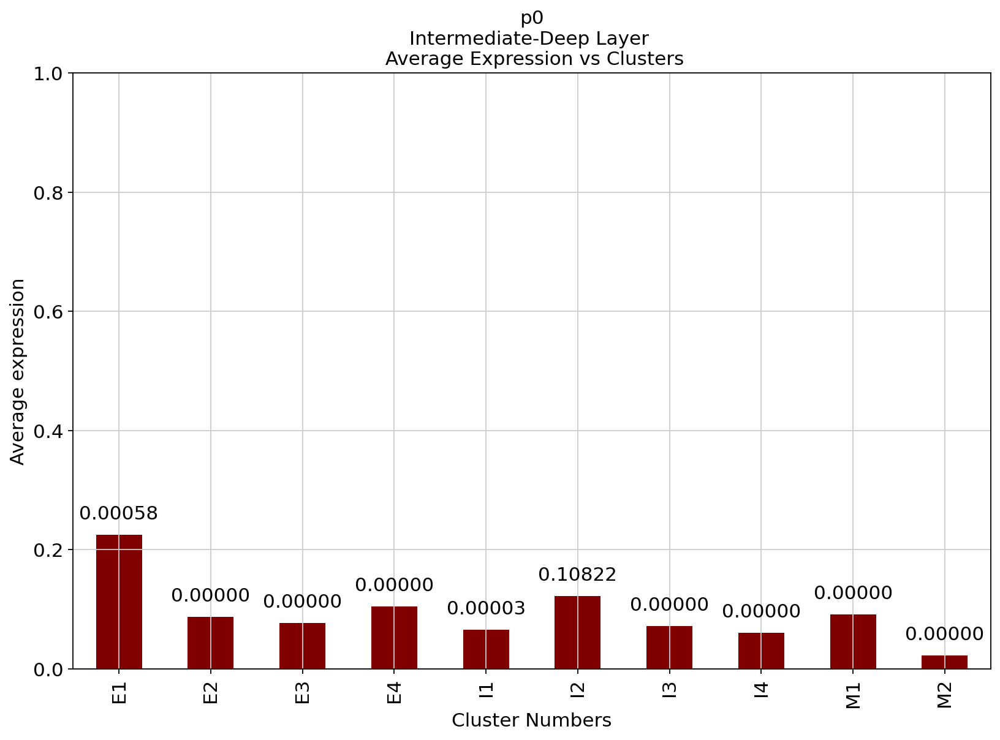

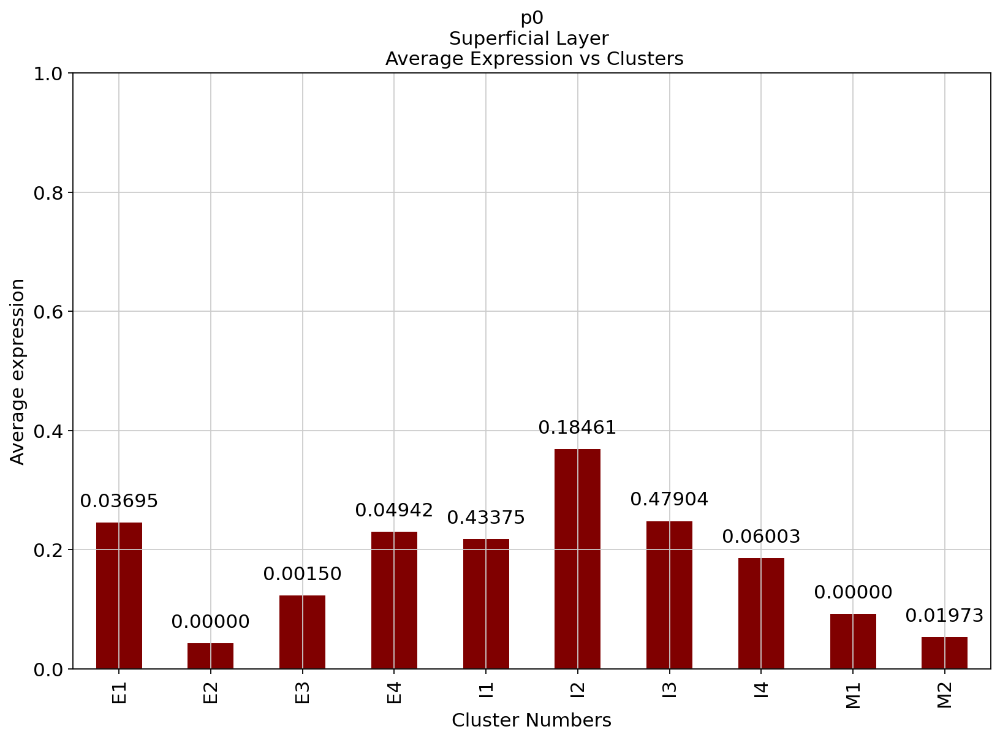

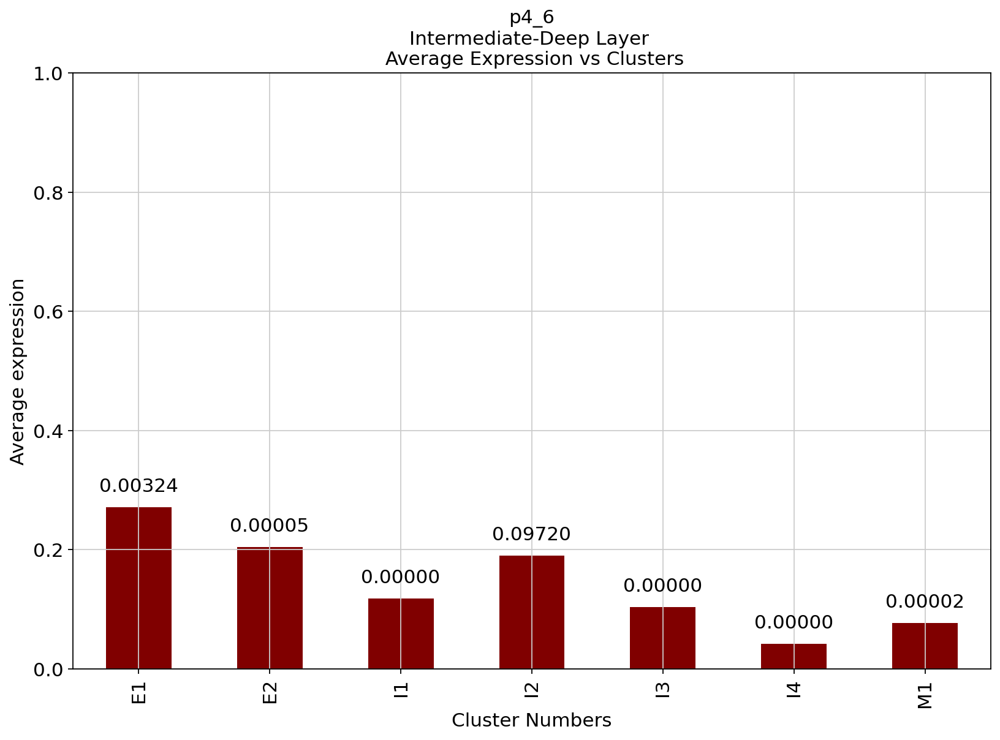

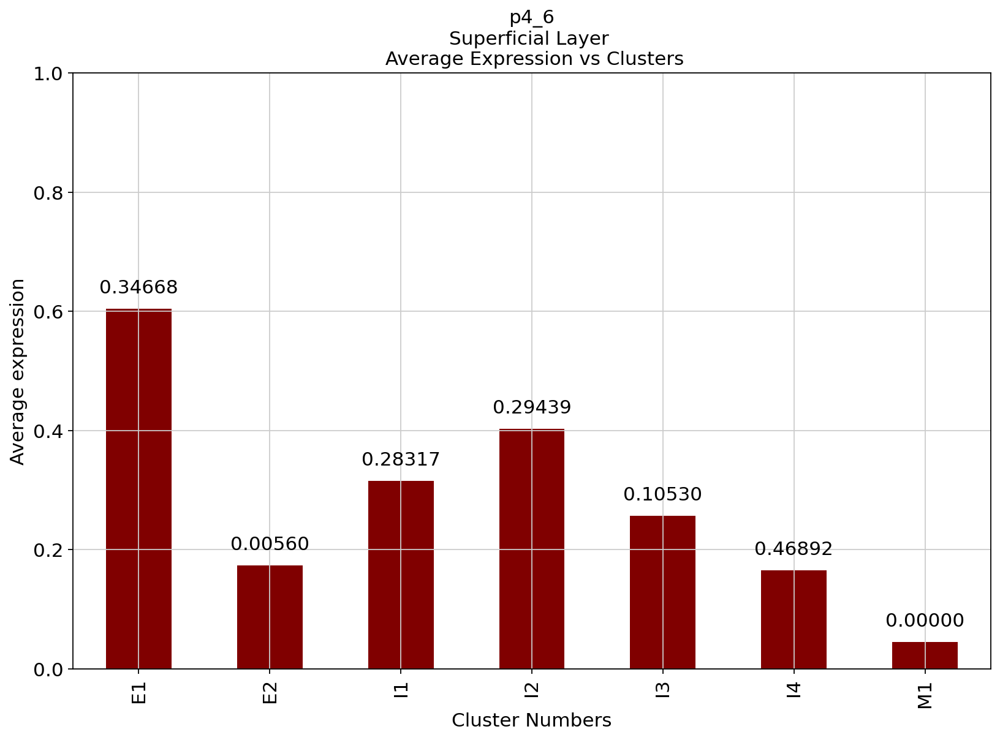

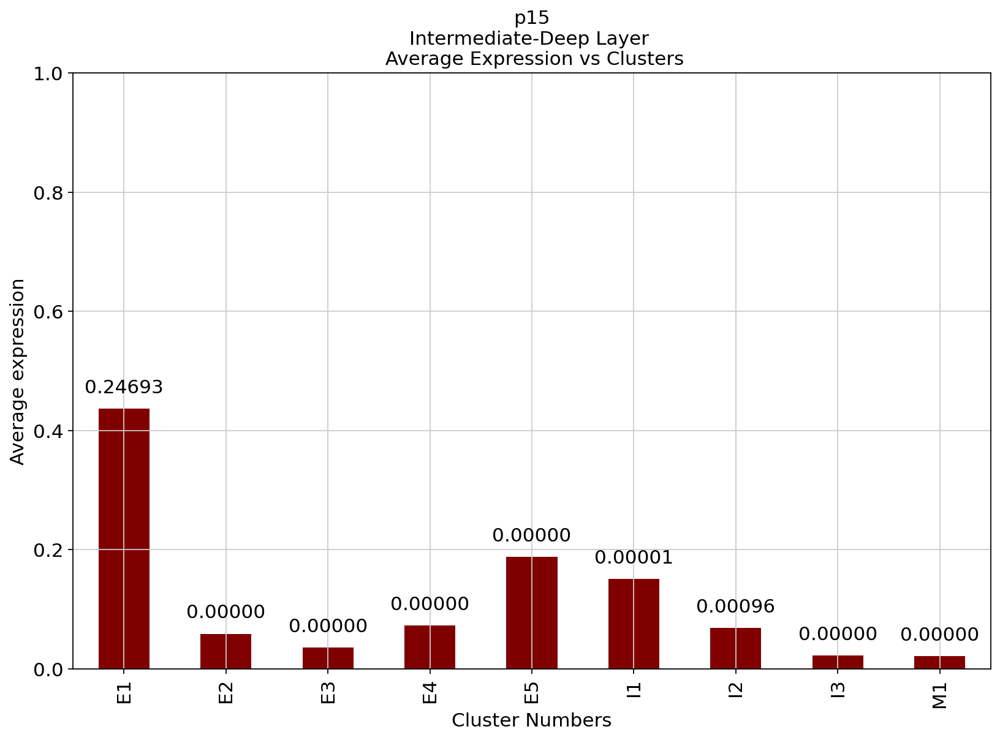

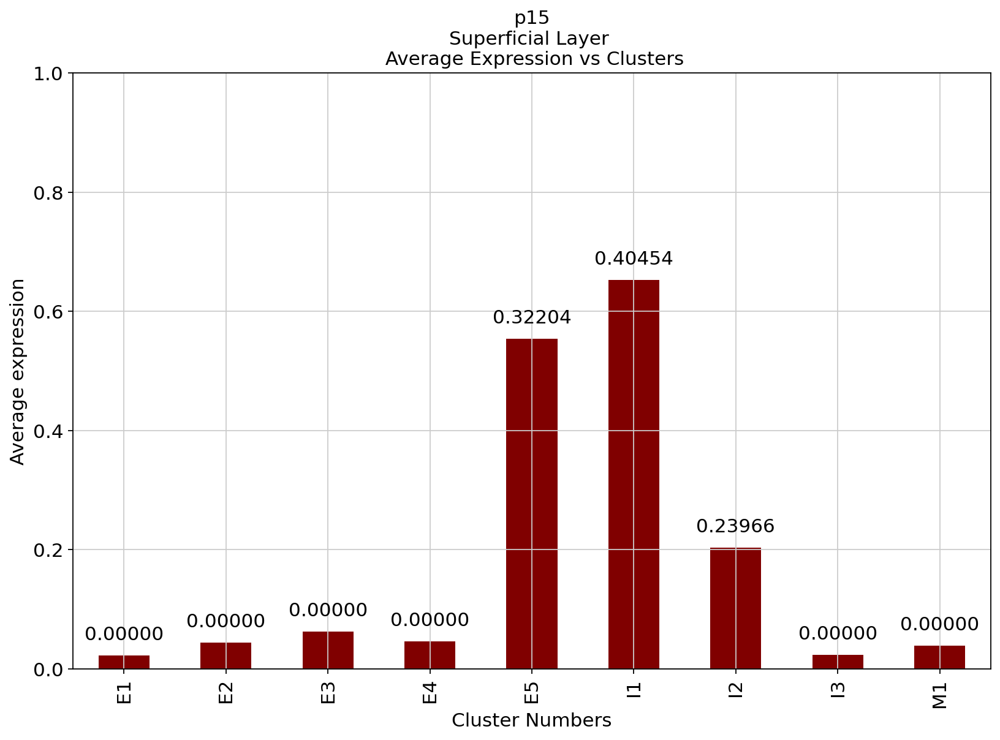

In [98]:
p_value_bool = True
Layer_Cluster_Relation.Plot_Layer_Expression_Distribution(p0_p4_6_p15_layer_specific_exp_comb_mean_dict, p_value_bool, p0_p4_6_p15_layer_specific_exp_comb_p_value_dict, layer_specific_comb_expression_correlation_dir)

In [99]:
diff_dataFrame_p0_negative = sc.get.rank_genes_groups_df(p0_doubletfiltered_neuronal,  group = None, log2fc_min = None,log2fc_max= 0,  pval_cutoff=0.09)
diff_dataFrame_p0_strict_cutoff_negative = sc.get.rank_genes_groups_df(p0_doubletfiltered_neuronal,  group = None, log2fc_min = None,log2fc_max= 0, pval_cutoff=0.05)
diff_dataFrame_p0_negative

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,E1,Gm29340,-2.258643,-21.393450,2.396222e-02,8.971383e-02
1,E1,Fam114a1,-2.258912,-21.223219,2.394546e-02,8.968840e-02
2,E1,Gm38336,-2.263236,-21.022385,2.367748e-02,8.881255e-02
3,E1,Rftn2,-2.265282,-21.294212,2.355161e-02,8.844318e-02
4,E1,Gm26664,-2.265956,-20.911203,2.351022e-02,8.830829e-02
...,...,...,...,...,...,...
32107,M2,Plxna2,-19.122988,-27.110687,6.763819e-78,2.183902e-74
32108,M2,Stk32c,-19.124100,-27.093912,6.633608e-78,2.183902e-74
32109,M2,Abca5,-20.710133,-27.375950,2.357572e-90,1.268688e-86
32110,M2,Kitl,-21.277088,-28.055845,5.384808e-95,4.346617e-91


In [100]:
diff_dataFrame_p4_6_negative = sc.get.rank_genes_groups_df(p4_6_doubletfiltered_neuronal,  group = None, log2fc_min = None,log2fc_max= 0, pval_cutoff=0.09)
diff_dataFrame_p4_6_strict_cutoff_negative = sc.get.rank_genes_groups_df(p4_6_doubletfiltered_neuronal,  group = None, log2fc_min = None, log2fc_max= 0, pval_cutoff=0.05)
diff_dataFrame_p4_6_strict_cutoff_negative

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,E1,Als2cl,-2.803272,-23.649748,5.126929e-03,4.998136e-02
1,E1,Jhy,-2.805697,-23.108423,5.088713e-03,4.966879e-02
2,E1,Mcm8,-2.809260,-23.237997,5.033040e-03,4.915511e-02
3,E1,Wdr81,-2.809828,-23.338411,5.024220e-03,4.912841e-02
4,E1,Sdsl,-2.814786,-23.041021,4.947784e-03,4.843968e-02
...,...,...,...,...,...,...
12626,M1,Actg1,-25.698242,-3.620817,1.224211e-92,1.796697e-89
12627,M1,Ubb,-25.848011,-3.664456,9.389082e-99,2.526289e-95
12628,M1,Stmn1,-27.824770,-3.787178,9.169328e-99,2.526289e-95
12629,M1,Tuba1a,-28.264986,-3.891696,1.010314e-104,1.631051e-100


In [101]:
diff_dataFrame_p10_negative = sc.get.rank_genes_groups_df(p10_doubletfiltered_neuronal,  group = None, log2fc_min = None,log2fc_max= 0,  pval_cutoff=0.09)
diff_dataFrame_p10_strict_cutoff_negative = sc.get.rank_genes_groups_df(p10_doubletfiltered_neuronal,  group = None, log2fc_min = None, log2fc_max= 0, pval_cutoff=0.05)
diff_dataFrame_p10_negative

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,E1,Pcdhgc5,-2.409862,-24.103706,1.624878e-02,8.998982e-02
1,E1,Mblac1,-2.411345,-24.122385,1.618351e-02,8.965909e-02
2,E1,Esyt1,-2.411985,-24.043869,1.615539e-02,8.953401e-02
3,E1,Cdc42ep4,-2.412368,-24.080439,1.613857e-02,8.947154e-02
4,E1,Gstm6,-2.412693,-24.063000,1.612433e-02,8.945403e-02
...,...,...,...,...,...,...
20237,M1,Gng3,-17.121847,-3.799941,2.501315e-49,5.047653e-46
20238,M1,Gm1673,-17.717897,-4.049802,2.979240e-51,6.870979e-48
20239,M1,Hspa8,-18.013069,-4.084318,9.230252e-53,2.483553e-49
20240,M1,Tubb5,-20.878687,-4.348527,4.167951e-62,1.682185e-58


In [102]:
diff_dataFrame_p15_negative = sc.get.rank_genes_groups_df(p15_doubletfiltered_neuronal,  group = None, log2fc_min = None,log2fc_max= 0,  pval_cutoff=0.09)
diff_dataFrame_p15_strict_cutoff_negative = sc.get.rank_genes_groups_df(p15_doubletfiltered_neuronal,  group = None,log2fc_min = None,log2fc_max= 0, pval_cutoff=0.05)
diff_dataFrame_p15_negative

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,E1,Hspb1,-2.360732,-22.012751,1.829851e-02,8.989990e-02
1,E1,Cryba1,-2.361077,-21.815441,1.828153e-02,8.984386e-02
2,E1,Tssk6,-2.361133,-20.950785,1.827876e-02,8.984386e-02
3,E1,Gm28043,-2.361196,-21.505692,1.827568e-02,8.984386e-02
4,E1,Ppp1r1c,-2.361390,-21.553146,1.826611e-02,8.984386e-02
...,...,...,...,...,...,...
27262,M1,Rmst,-21.853609,-3.188022,6.940608e-77,2.240984e-73
27263,M1,Miat,-22.487049,-3.588516,2.130324e-84,1.146398e-80
27264,M1,Meg3,-23.060087,-4.757599,7.409711e-70,1.495280e-66
27265,M1,Snhg11,-27.286177,-4.354235,3.200959e-86,2.583814e-82


# Schizophrenia and Autism Gene Dotplots

- Plots all the Schizophrenia and Autism Genes with respect to their clusters and timepoints

In [103]:
schizophrenia_autism_gene_dotplots_dir = testing_results_dir + 'Schizophrenia_Autism_Gene_Dotplots'
if os.path.exists(schizophrenia_autism_gene_dotplots_dir):
  shutil.rmtree(schizophrenia_autism_gene_dotplots_dir)
os.mkdir(schizophrenia_autism_gene_dotplots_dir)

In [104]:
sc.settings.figdir = schizophrenia_autism_gene_dotplots_dir

In [105]:
Schizophrenia_dataset = ['Atp2a2', 'Bcl11b', 'Cacna1c', 'Cacnb2', 'Camkk2', 'Chrna3', 'Chrna5', 'Clcn3', 'Cnksr2', 'Cntn4', 'Comt', 'Disc1', 'Drd2', 'Fxr1', 'Gria1', 'Grin2a', 'Grm3', 'Hcn1', 'Htr2a', 'Kcnb1', 'Kctd13', 'Mef2c', 'Mthfr', 'Nrgn', 'Nrxn1', 'Pak6', 'Plcl1', 'Prodh', 'Ptn', 'Rbm12', 'Rtn4r', 'Sf3b1', 'Shank3', 'Slc1a1', 'Slc38a7', 'Snap91', 'Srr', 'Syn2', 'Tle1', 'Tle3', 'Vipr2']
Autism_dataset_1 = ['Adnp', 'Aff2', 'Ahdc1', 'Aldh5a1', 'Ank2', 'Ank3', 'Ankrd11',  'Ash1l', 'Asxl3', 'Atrx', 'Auts2', 'Bcl11a', 'Cacna1c', 'Cacna1e', 'Cask', 'Cdk15', 'Celf4', 'Chd2', 'Chd7', 'Chd8', 'Crebbp', 'Ctcf', 'Cul3', 'Ddx3x', 'Deaf1', 'Dhcr7', 'Dpysl2', 'Dync1h1', 'Dyrk1a', 'Ehmt1', 'Ep300', 'Fmr1', 'Foxp1', 'Foxp2', 'Gabrb3','Hras', 'Katnal2', 'Kcnq3', 'Kdm5b', 'Kdm6a', 'Kmt2a', 'Kmt2c']
Autism_dataset_2 = ['Lztr1', 'Magel2', 'Mbd5', 'Mecp2', 'Med13l', 'Myt1l', 'Naa15', 'Nbea', 'Nf1', 'Nipbl', 'Nlgn3', 'Nrxn1', 'Nrxn2', 'Nrxn3', 'Nsd1', 'Pcdh19', 'Phip', 'Pogz', 'Ppp2r5d', 'Ptchd1', 'Pten', 'Ptpn11', 'Rai1', 'Reln', 'Scn1a', 'Scn8a', 'Setbp1', 'Setd2', 'Setd5', 'Shank2', 'Shank3', 'Sin3a', 'Slc6a1', 'Slc9a6', 'Smarcc2', 'Spast', 'Syngap1', 'Tanc2', 'Tbl1xr1', 'Tbr1', 'Tcf20', 'Tcf4', 'Tlk2', 'Tsc1', 'Tsc2', 'Ube3a', 'Upf3b', 'Wac', 'Wdfy3', 'Zbtb20']
datasets = [Schizophrenia_dataset, Autism_dataset_1, Autism_dataset_2]
datasets_name = ['Schizophrenia Genes', 'Autism Genes Dataset 1', 'Autism Genes Dataset 2']

In [106]:
for dataset, dataset_name in zip(datasets, datasets_name):
  for anndata, t_name in zip(timepoints_anndata, timepoints_anndata_names):
    time = ''
    if '/' in t_name:
      time = t_name.replace('/','_')
    else:
      time = t_name
    sc.pl.dotplot(anndata, dataset, mean_only_expressed=True, groupby=['E_I_M'], title= dataset_name+'\n'+t_name, save=time+'_'+dataset_name+'.png');

Output hidden; open in https://colab.research.google.com to view.